# NGC 346 stars from Sabbi et al (2007)

In my never-ending quest to get a catalog of all the stars in NGC 346, I am now going to try using the astroquery Vizier interface to get the tables from: 

```bibtex
@article{Sabbi:2007h,
	author = {{Sabbi}, E. and {Sirianni}, M. and {Nota}, A. and {Tosi}, M. and {Gallagher}, J. and {Meixner}, M. and {Oey}, M.~S. and {Walterbos}, R. and {Pasquali}, A. and {Smith}, L.~J. and {Angeretti}, L.},
	journal = {\aj},
	month = jan,
	number = {1},
	pages = {44-57},
	title = {{Past and Present Star Formation in the SMC: NGC 346 and its Neighborhood}},
	volume = {133},
	year = 2007}

```

## Find which catalog we want

I had to install the `astroquery` library from conda-forge.

In [2]:
from astroquery.vizier import Vizier

I am following a similar method to the examples in the [astroquery docs](https://astroquery.readthedocs.io/en/latest/vizier/vizier.html):

In [6]:
catalog_list = Vizier.find_catalogs('Sabbi 2007')

We now have a list of matching catalogs:

In [5]:
for k,v in catalog_list.items():
    print(k)
    print(v.description, end="\n\n")

J/ApJ/730/78
Hubble and Spitzer photometry of NGC 602 (Carlson+, 2011)

J/ApJ/872/199
Candidate spectrophotometric standard DA WDs (Calamida+, 2019)

J/ApJS/222/11
Hubble Tarantula Treasury Project (HTTP). III. (Sabbi+, 2016)

J/ApJS/235/23
LEGUS galaxies1 observations (Sabbi+, 2018)

J/A+A/464/939
Abundances of red giants in NGC 6218 (Carretta+, 2007)

J/A+A/505/117
Abundances of red giants in 15 globular clusters (Carretta+, 2009)

J/A+A/598/A5
Gaia-ESO Survey iDR4 calibrators (Pancino+, 2017)

J/A+A/636/A54
Massive young stellar objects in 30 Doradus (van Gelder+, 2020)

J/AJ/133/44
NGC 346 HST VI photometry (Sabbi+, 2007)

J/AJ/136/1703
Ridgelines of six intermediate-age SMC clusters (Glatt+, 2008)

J/AJ/156/98
Runaway stars in the 30 Doradus region of the LMC (Platais+, 2018)

J/AJ/158/201
Young star cluster Westerlund 2 observed with MUSE (Zeidler+, 2019)

J/MNRAS/452/3508
Young stellar structures in NGC 6503 (Gouliermis+, 2015)



This gave more than I was expecting, but the one we want is `J/AJ/133/44`:

In [13]:
catalog_id = "J/AJ/133/44"

## Download the tables

We have to set `Vizier.ROW_LIMIT = -1` to make sure we get the complete table.  Otherwise, the default is to return only 50 rows.

In [12]:
Vizier.ROW_LIMIT = -1
catalogs = Vizier.get_catalogs(catalog_id)
catalogs

TableList with 2 tables:
	'0:J/AJ/133/44/table2' with 8 column(s) and 79960 row(s) 
	'1:J/AJ/133/44/table3' with 8 column(s) and 16 row(s) 

This gives two tables.  The first is a list of all 79960 stars that they have found in NGC 346.  The second is a list of the 16 sub-clusters that they have identified:

In [15]:
stars, subclusters = catalogs
subclusters

__SSN2007_,RAJ2000,DEJ2000,Rad,Age,e_Age,Npms,Dpms
,"""h:m:s""","""d:m:s""",pc,Myr,Myr,,1 / pc2
str5,str10,str9,float32,int16,float32,int16,float32
Sc 1,00 59 05.2,-72 10 28,2.5,3,1.0,342,17.4
Sc 2,00 59 01.8,-72 10 35,2.3,3,1.0,295,17.8
Sc 3,00 59 06.0,-72 10 43,1.6,3,1.0,138,17.2
Sc 4,00 59 02.5,-72 10 07,0.6,3,1.0,20,17.7
Sc 5,00 59 00.3,-72 10 04,1.1,3,1.0,32,8.4
Sc 6,00 58 57.4,-72 09 55,1.2,3,1.0,14,3.1
Sc 7,00 59 05.4,-72 10 57,1.5,3,1.0,65,9.2
Sc 8,00 59 07.7,-72 10 48,1.9,3,1.0,109,9.6


## Look at the star catalog

In [16]:
stars

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",
int32,float32,float32,float32,float32,str12,str12,int16
1,11.570,0.001,11.557,0.001,00 59 26.581,-72 09 53.00,--
2,11.916,0.001,11.841,0.001,00 59 26.571,-72 09 53.99,--
4,12.326,0.001,11.793,0.001,00 58 42.424,-72 09 43.27,185
5,12.551,0.002,12.397,0.001,00 59 31.975,-72 10 46.11,789
6,12.580,0.001,12.304,0.001,00 59 26.542,-72 09 53.00,--
7,12.609,0.002,12.742,0.002,00 59 04.479,-72 10 24.77,435
8,12.734,0.002,12.398,0.001,00 59 31.975,-72 10 46.13,--
9,13.454,0.002,13.679,0.003,00 59 00.743,-72 10 28.16,355


## Put the coordinate columns in a more useful form

We want to convert the coordinate columns into degrees for ease of plotting, so we need some astropy libraries:

In [20]:
from astropy.coordinates import SkyCoord, Angle, Latitude, Longitude
import astropy.units as u

I had originally thought of using SkyCoord, but this is not necessary

In [26]:
# SkyCoord(stars["RAJ2000"], stars["DEJ2000"], unit=(u.hourangle, u.deg))

Easier to just convert the RA and DEC columns separately (note, these cells take a while to run – 10s of seconds on my laptop):

In [21]:
ra = Longitude(stars["RAJ2000"], unit=u.hourangle)

In [22]:
dec = Latitude(stars["DEJ2000"], unit=u.deg)

Check that the values in degrees look reasonable:

In [29]:
ra.to(u.deg), dec

(<Longitude [14.86075417, 14.8607125 , 14.67676667, ..., 14.87165417,
             14.6834    , 14.90071667] deg>,
 <Latitude [-72.16472222, -72.16499722, -72.16201944, ..., -72.17717222,
            -72.20573611, -72.14438056] deg>)

Add them in as new columns to the table and set display precision to about 10 mas. 

In [30]:
stars["ra"] = ra.to(u.deg)
stars["dec"] = dec
stars["ra"].format = "{:.6f}"
stars["dec"].format = "{:.6f}"
stars

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64
1,11.570,0.001,11.557,0.001,00 59 26.581,-72 09 53.00,--,14.860754,-72.164722
2,11.916,0.001,11.841,0.001,00 59 26.571,-72 09 53.99,--,14.860712,-72.164997
4,12.326,0.001,11.793,0.001,00 58 42.424,-72 09 43.27,185,14.676767,-72.162019
5,12.551,0.002,12.397,0.001,00 59 31.975,-72 10 46.11,789,14.883229,-72.179475
6,12.580,0.001,12.304,0.001,00 59 26.542,-72 09 53.00,--,14.860592,-72.164722
7,12.609,0.002,12.742,0.002,00 59 04.479,-72 10 24.77,435,14.768662,-72.173547
8,12.734,0.002,12.398,0.001,00 59 31.975,-72 10 46.13,--,14.883229,-72.179481
9,13.454,0.002,13.679,0.003,00 59 00.743,-72 10 28.16,355,14.753096,-72.174489


## Add $V - I$ color to the table

For some reason the units get lost, so I add them explicitly and set the display precision to be the same as for the original photometry columns.  For good measure, I also do the error propagation. 

In [34]:
import numpy as np

In [35]:
stars["V-I"] = stars["F555W"] - stars["F814W"]
stars["V-I"].format = "{:.3f}"
stars["V-I"].unit = u.mag

stars["e_V-I"] = np.hypot(stars["e_F555W"], stars["e_F814W"])
stars["e_V-I"].format = "{:.3f}"
stars["e_V-I"].unit = u.mag

stars

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32
1,11.570,0.001,11.557,0.001,00 59 26.581,-72 09 53.00,--,14.860754,-72.164722,0.013,0.001
2,11.916,0.001,11.841,0.001,00 59 26.571,-72 09 53.99,--,14.860712,-72.164997,0.075,0.001
4,12.326,0.001,11.793,0.001,00 58 42.424,-72 09 43.27,185,14.676767,-72.162019,0.533,0.001
5,12.551,0.002,12.397,0.001,00 59 31.975,-72 10 46.11,789,14.883229,-72.179475,0.154,0.002
6,12.580,0.001,12.304,0.001,00 59 26.542,-72 09 53.00,--,14.860592,-72.164722,0.276,0.001
7,12.609,0.002,12.742,0.002,00 59 04.479,-72 10 24.77,435,14.768662,-72.173547,-0.133,0.003
8,12.734,0.002,12.398,0.001,00 59 31.975,-72 10 46.13,--,14.883229,-72.179481,0.336,0.002
9,13.454,0.002,13.679,0.003,00 59 00.743,-72 10 28.16,355,14.753096,-72.174489,-0.225,0.004


The stars seem to be listed in order of $V$-band brightness.  The brightest have $V < 12$ and have relatively blue colors, with very small errors on the color.  The faintest have $V \approx 27$ with uniformly red colors, $V - I \approx +1.5$ with color uncertainty $\approx 0.1$ mag. 

Some of the bright stars have $V - I < 0$, indicating that they are OB stars.  The bright ones with $V - I > 0$ could be red giants/AGB/supergiants or could be reddened OB stars.  The foreground reddening is very low, but there is patchy dense molecular gas.

Comparing with the O stars in Orion.  The brightest stars there have $V \approx 5$.  The distance to Orion is 0.41 pc, versus 61.7 kpc for the SMC, so the equivalent magnitude in NGC 346 would be:

In [36]:
5 + 5*np.log10(61.7/0.41)

15.88750653656753

So anything with $V < 16$ is brighter than the Orion stars.  We have lots of those, and the brightest is nearly 100 times brighter, which seems unlikely.  Perhaps it is a foreground contaminant, or maybe a small cluster.  Also, in Orion there is about 1 mag of foreground extinction.

## Plot the distribution of stars

In [31]:
from pathlib import Path

import pandas as pd
from astropy.io import fits, ascii
from astropy.wcs import WCS
from astropy.table import Table

from matplotlib import pyplot as plt
import seaborn as sns
sns.set_color_codes()
sns.set_context("talk")

Use the same nominal coordinates of NGC 346 that we used in the previous notebook for consistency:

In [59]:
ra0, dec0 = 14.77101, -72.1771

In [60]:
aspect = 1.0/np.cos(np.deg2rad(dec0))
print("Angle distorsion factor:", aspect)

Angle distorsion factor: 3.267164240186363


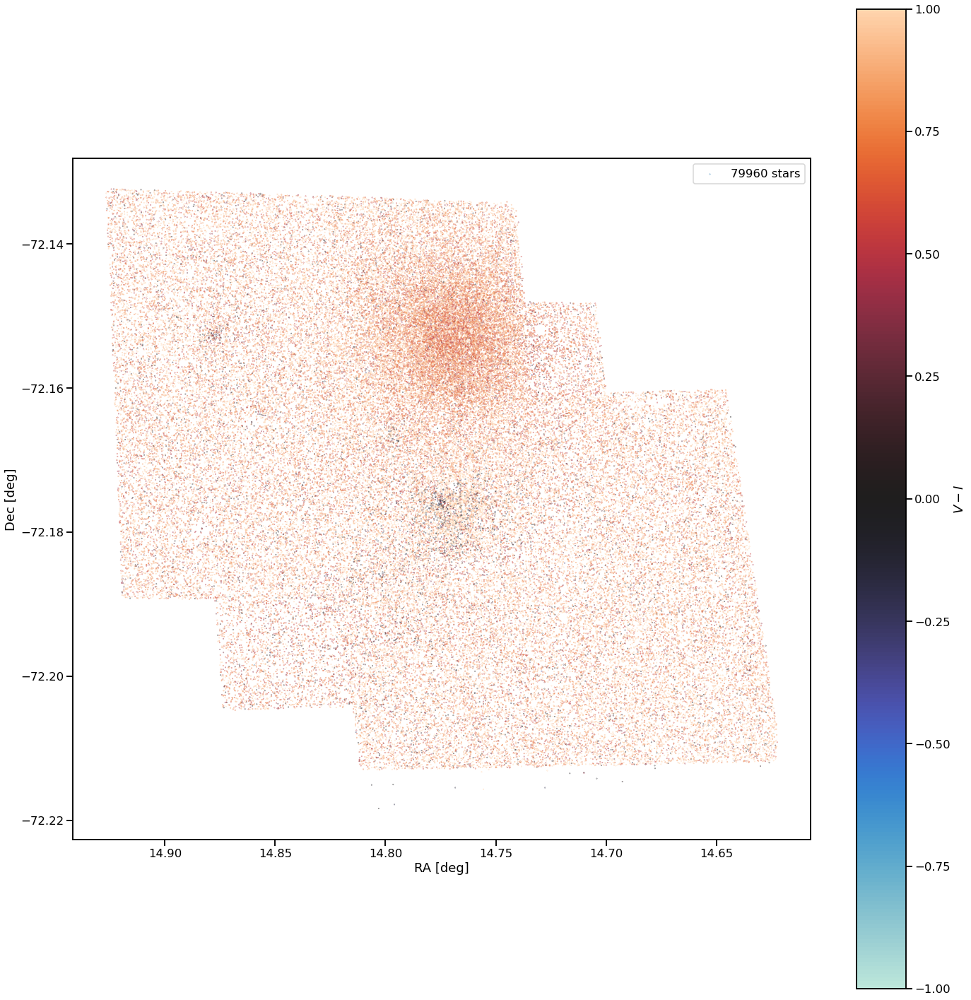

In [61]:
fig, ax = plt.subplots(figsize=(20, 20))

points = ax.scatter(
    stars['ra'].data, 
    stars['dec'].data, 
    s=0.1,
    c=stars["V-I"].data,
    vmin=-1.0,
    vmax=1.0,
    cmap="icefire",
    alpha=1.0,
    label=f'{len(stars)} stars'
)
fig.colorbar(points, ax=ax, label="$V - I$")
ax.invert_xaxis()
ax.set_aspect(aspect)
ax.set(
    xlabel='RA [deg]',
    ylabel='Dec [deg]',
)
ax.legend()
fig.tight_layout()

We can see an evolved cluster at the top center, which has red stars only.  The blue stars are concentrated in the core of NGC 346, which is in the center of the image. 

Now, we zoom in on the core:

[(14.74378363133178, 14.79823636866822),
 (-72.18543333333334, -72.16876666666666),
 Text(0.5, 0, 'RA [deg]'),
 Text(0, 0.5, 'Dec [deg]')]

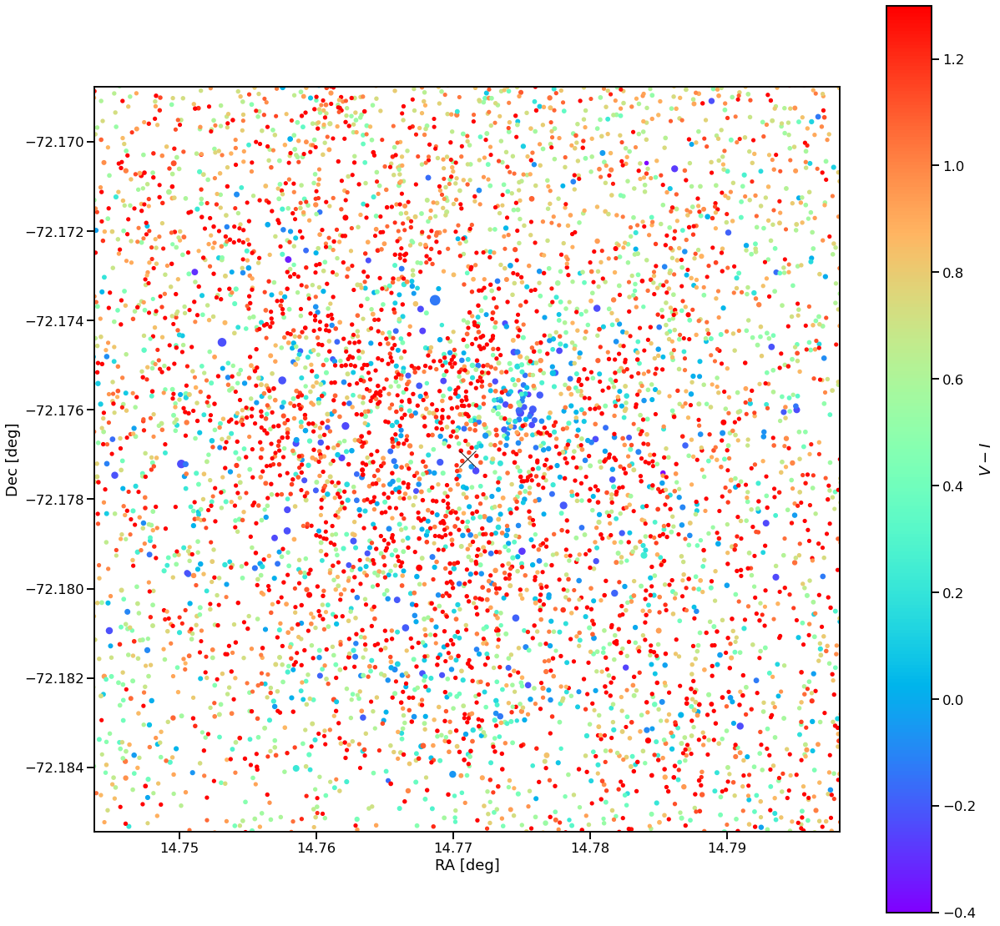

In [67]:
dec_range = 0.5/60.0
ra_range = dec_range * aspect

fig, ax = plt.subplots(figsize=(20, 20))

points = ax.scatter(
    stars['ra'].data, 
    stars['dec'].data, 
    c=stars["V-I"].data,
    s=200.0/(stars["F555W"] - 11.0),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
)
fig.colorbar(points, ax=ax, label="$V - I$")
ax.plot(ra0, dec0, 'kx', markersize=20)
ax.invert_xaxis()
ax.set_aspect(aspect)
ax.set(
    xlim=[ra0 - ra_range, ra0 + ra_range],
    ylim=[dec0 - dec_range, dec0 + dec_range],
    xlabel='RA [deg]',
    ylabel='Dec [deg]',
)

Comparing with the HSC results from the previous notebook, there seems to be an offset in the color values, which is odd.  The Sabbi colors are about +0.3 redder than the HSC ones.  I have adjusted the `vmin, vmax` values for the color bar so that the colors look similar to in the previous notebook. 

Apart from that, the results are comparable.  It looks like we have more sources here, which is good.

## Combine with Hα map

In [68]:
bigdatapath = Path("../big-data")
hdu = fits.open(bigdatapath / "ngc346-hst-acs-f658n-wcsgaia.fits")["SCI"]
w = WCS(hdu.header)
imha = hdu.data

I have loaded the ACS H alpha image, which has been aligned to the Gaia coordinate frame. I also load the table of Gaia source positions. So, we will be able to see if there is any problem with the Sabbi coordinates:

In [69]:
datapath = Path("../data")
dfgaia = pd.read_csv(datapath / "1621565655827O-result.csv")

Now plot everything together.  Just to make misalignments super obvious, I will zoom in even more than I did before:

In [77]:
x0, y0 = 2600, 2200
#dx, dy = 200, 200
dx, dy = 100, 100

<ipython-input-78-f2ee2e016041>:4: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-78-f2ee2e016041>:4: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


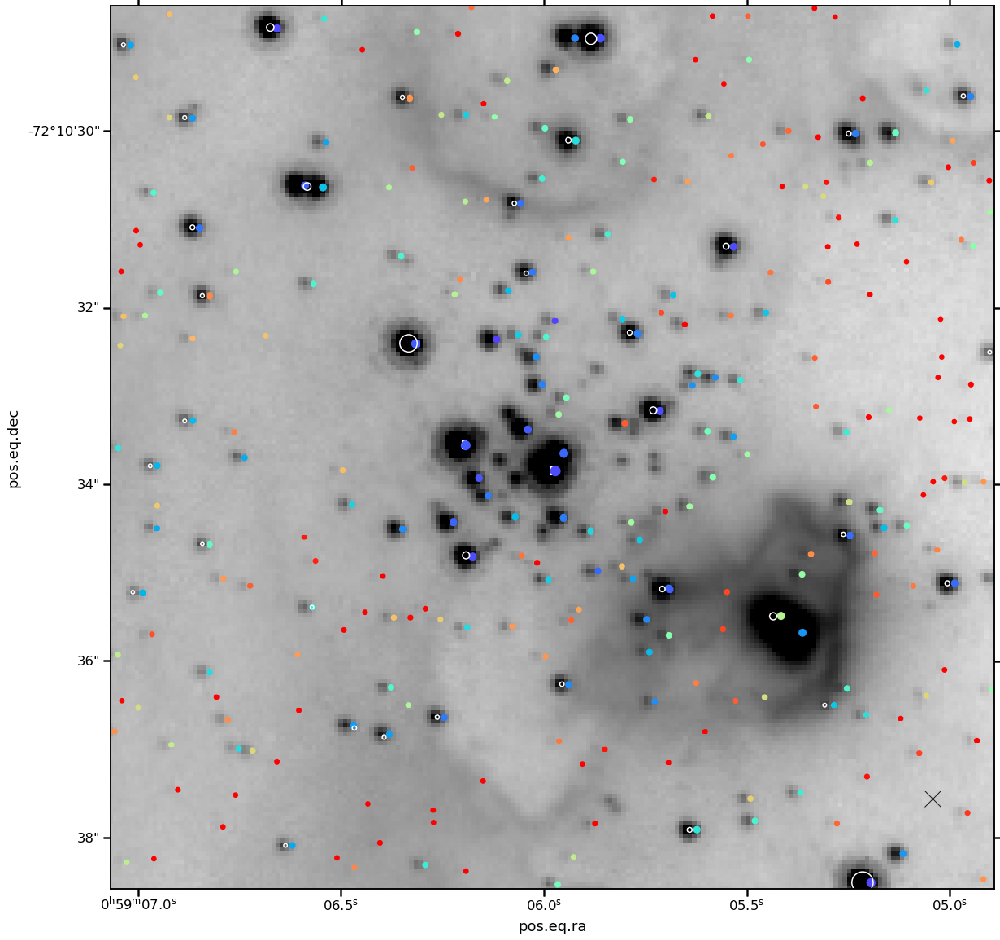

In [78]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-0.7, vmax=0.7, 
    cmap="gray_r",
)
points = ax.scatter(
    stars['ra'].data, 
    stars['dec'].data, 
    c=stars["V-I"].data,
    s=400.0/(stars["F555W"] - 11.0),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
#fig.colorbar(points, ax=ax, label="$V - I$")
gpoints = ax.scatter(
    x="ra", y="dec", 
    edgecolors="w", 
    data=dfgaia,
    s=100/(dfgaia["phot_g_mean_mag"] - 15), 
    alpha=1.0,
    facecolor="none",
    transform=ax.get_transform('world'),
)
ax.plot(ra0, dec0, 'kx', markersize=20, transform=ax.get_transform('world'),)

ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
);

It is clear there is an offset in RA with the Sabbi position. It looks to be about 2 ACS pixels, or 0.1 arcsec. So, we will fix that:

In [108]:
rafix = ra + aspect * 0.08 * u.arcsec
rafix

<Angle [0.99072178, 0.99071901, 0.97845595, ..., 0.99144845, 0.97889817,
        0.99338595] hourangle>

In [109]:
stars["ra"] = rafix.to(u.deg)
stars["ra"].format = "{:.6f}"
stars[:2]

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32
1,11.570,0.001,11.557,0.001,00 59 26.581,-72 09 53.00,--,14.860827,-72.164722,0.013,0.001
2,11.916,0.001,11.841,0.001,00 59 26.571,-72 09 53.99,--,14.860785,-72.164997,0.075,0.001


So that looks OK,  The RA column has changed in the last three digits.

<ipython-input-111-9f1146b873fd>:4: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-111-9f1146b873fd>:4: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


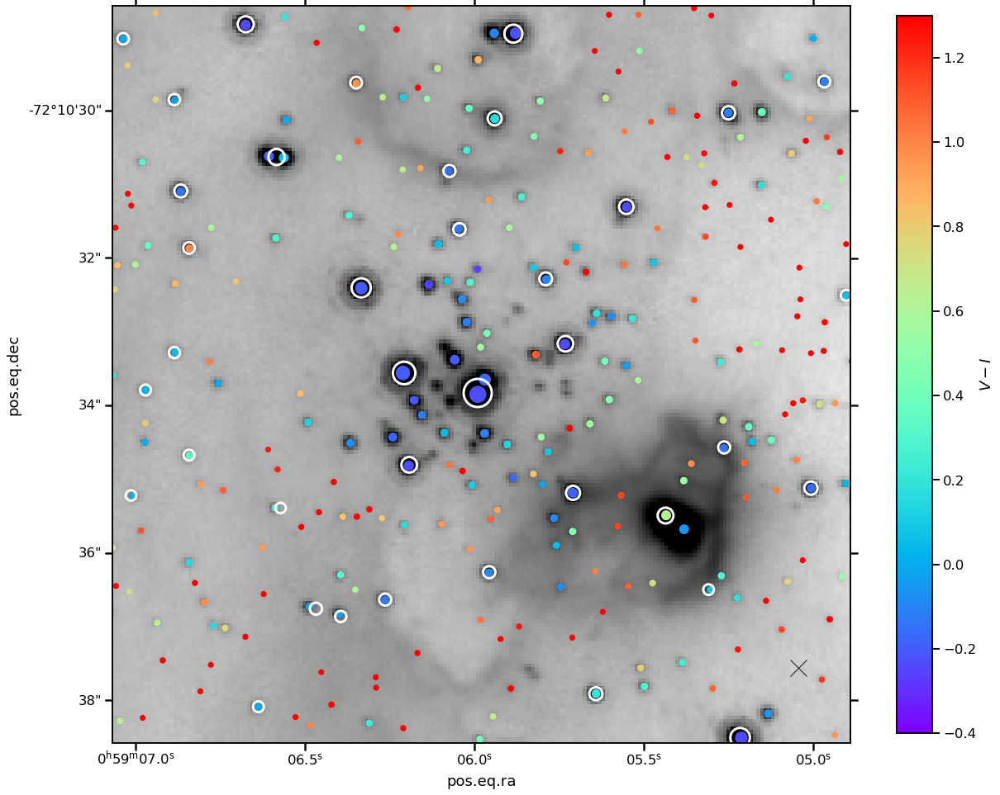

In [111]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-0.7, vmax=0.7, 
    cmap="gray_r",
)
points = ax.scatter(
    stars['ra'].data, 
    stars['dec'].data, 
    c=stars["V-I"].data,
    s=400.0/(stars["F555W"] - 13.0),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
fig.colorbar(points, ax=ax, label="$V - I$", shrink=0.8)
gpoints = ax.scatter(
    x="ra", y="dec", 
    edgecolors="w", 
    data=dfgaia,
    s=1200/(dfgaia["phot_g_mean_mag"] - 13), 
    alpha=1.0,
    linewidth=3,
    facecolor="none",
    transform=ax.get_transform('world'),
)
ax.plot(ra0, dec0, 'kx', markersize=20, transform=ax.get_transform('world'),)

ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
);

That's looking a lot better now. 

Now, take a zoomed out view as well:

In [112]:
dx, dy = 1000, 1000

<ipython-input-118-0e594b857a64>:4: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-118-0e594b857a64>:4: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


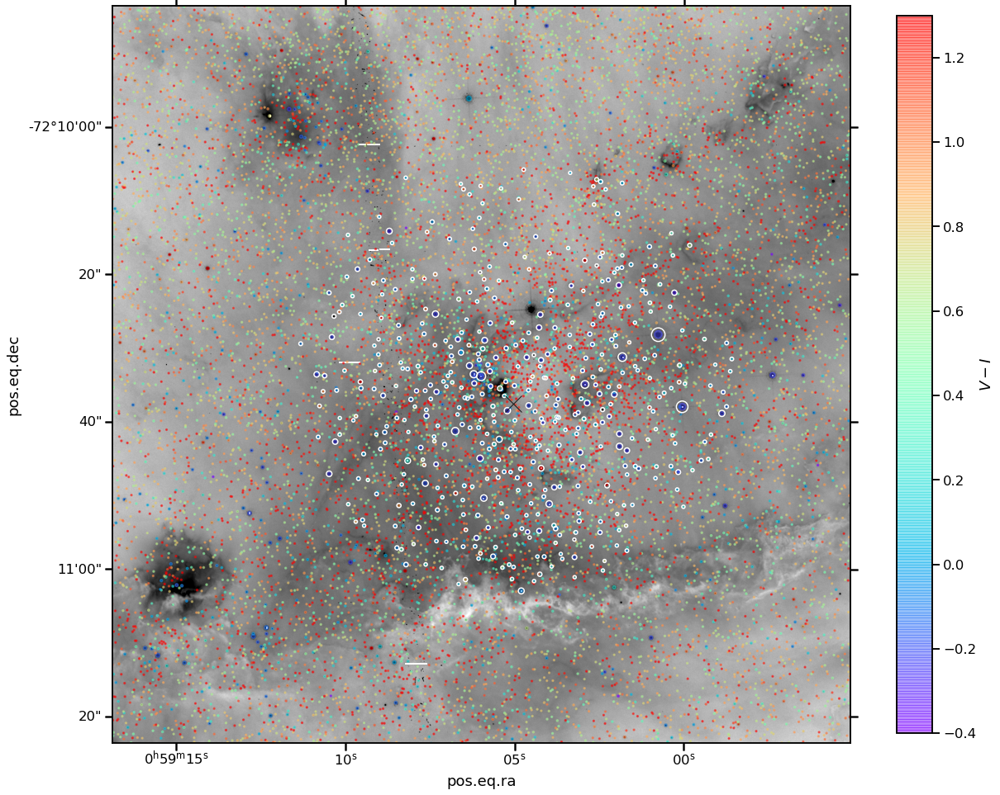

In [118]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-1.0, vmax=0.3, 
    cmap="gray_r",
)
points = ax.scatter(
    stars['ra'].data, 
    stars['dec'].data, 
    c=stars["V-I"].data,
    s=40.0/(stars["F555W"] - 13.0),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=0.5,
    transform=ax.get_transform('world'),    
)
fig.colorbar(points, ax=ax, label="$V - I$", shrink=0.8)
gpoints = ax.scatter(
    x="ra", y="dec", 
    edgecolors="w", 
    data=dfgaia,
    s=120/(dfgaia["phot_g_mean_mag"] - 13), 
    alpha=1.0,
    linewidth=1.5,
    facecolor="none",
    transform=ax.get_transform('world'),
)
ax.plot(ra0, dec0, 'kx', markersize=20, transform=ax.get_transform('world'),)

ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
);

## Add in the sub-cluster positions

Put the coordinates in degrees. And also convert the cluster radius to degrees:

In [121]:
ra_sc = Longitude(subclusters["RAJ2000"], unit=u.hourangle)
dec_sc = Latitude(subclusters["DEJ2000"], unit=u.deg)
subclusters["ra"] = ra_sc.to(u.deg)
subclusters["dec"] = dec_sc
subclusters["ra"].format = "{:.6f}"
subclusters["dec"].format = "{:.6f}"

In [128]:
D_smc = 61.7*u.kpc
R_deg = (subclusters["Rad"].to(u.au).value / (D_smc.to(u.pc)).value) * u.arcsec#.to(u.deg)
R_deg

<Quantity [8.35757  , 7.688964 , 5.3488445, 2.0058167, 3.6773305,
           4.0116334, 5.0145416, 6.3517523, 3.3430278, 5.3488445,
           3.6773305, 5.0145416, 6.3517523, 3.008725 , 2.0058167,
           5.3488445] arcsec>

In [129]:
subclusters["R"] = R_deg
subclusters

__SSN2007_,RAJ2000,DEJ2000,Rad,Age,e_Age,Npms,Dpms,ra,dec,R
,"""h:m:s""","""d:m:s""",pc,Myr,Myr,,1 / pc2,deg,deg,arcsec
str5,str10,str9,float32,int16,float32,int16,float32,float64,float64,float32
Sc 1,00 59 05.2,-72 10 28,2.5,3,1.0,342,17.4,14.771667,-72.174444,8.35757
Sc 2,00 59 01.8,-72 10 35,2.3,3,1.0,295,17.8,14.757500,-72.176389,7.688964
Sc 3,00 59 06.0,-72 10 43,1.6,3,1.0,138,17.2,14.775000,-72.178611,5.3488445
Sc 4,00 59 02.5,-72 10 07,0.6,3,1.0,20,17.7,14.760417,-72.168611,2.0058167
Sc 5,00 59 00.3,-72 10 04,1.1,3,1.0,32,8.4,14.751250,-72.167778,3.6773305
Sc 6,00 58 57.4,-72 09 55,1.2,3,1.0,14,3.1,14.739167,-72.165278,4.0116334
Sc 7,00 59 05.4,-72 10 57,1.5,3,1.0,65,9.2,14.772500,-72.182500,5.0145416
Sc 8,00 59 07.7,-72 10 48,1.9,3,1.0,109,9.6,14.782083,-72.180000,6.3517523


In [130]:
from astropy.visualization.wcsaxes import SphericalCircle

<ipython-input-145-982bfc2b640a>:4: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-145-982bfc2b640a>:4: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),


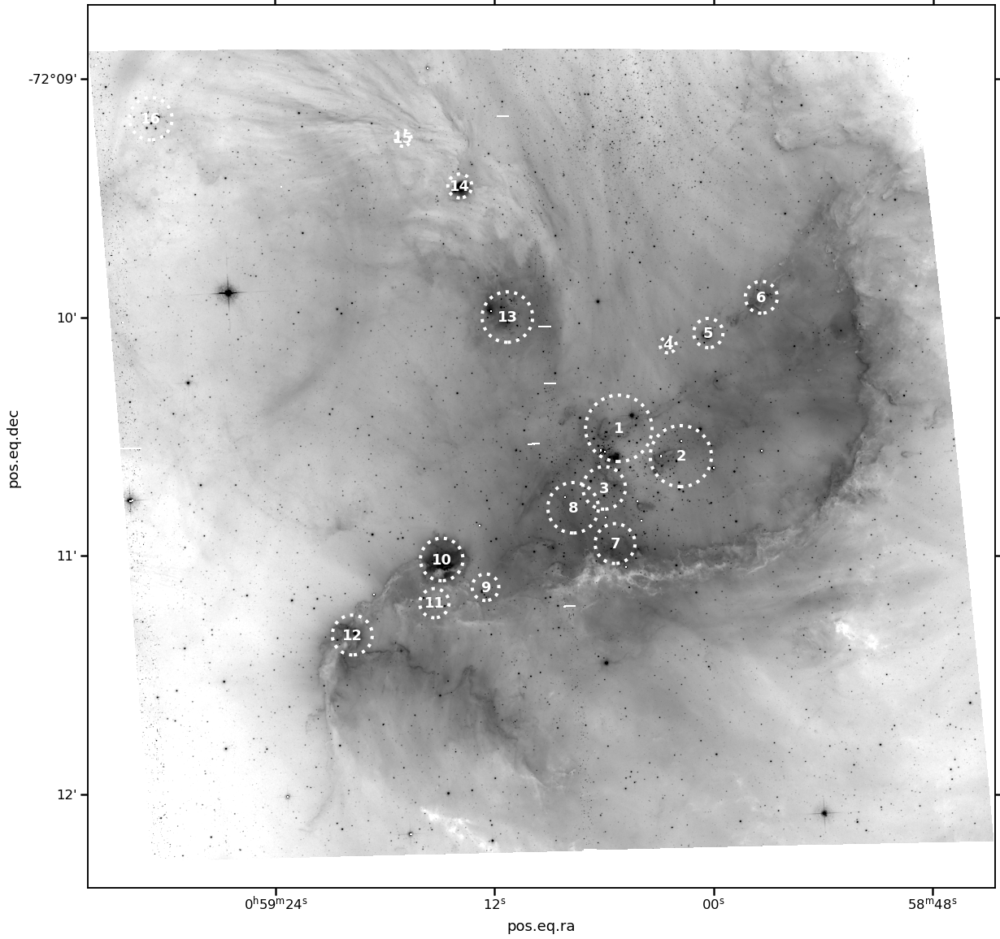

In [145]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-1.2, vmax=0.3, 
    cmap="gray_r",
)
for data in subclusters:
    circ = SphericalCircle(
        (data["ra"]*u.deg, data["dec"]*u.deg), 
        data["R"]*u.arcsec,
        edgecolor='w', facecolor='none', 
        linestyle="dotted",
        linewidth=4,
        transform=ax.get_transform("world"),
    )
    ax.add_patch(circ)
    ax.text(
        data["ra"], data["dec"], data["__SSN2007_"].split()[-1],
        ha="center", va="center", color="w",
        fontweight="black",
        transform=ax.get_transform("world"),
    )

<ipython-input-152-641a3966dbae>:4: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-152-641a3966dbae>:4: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


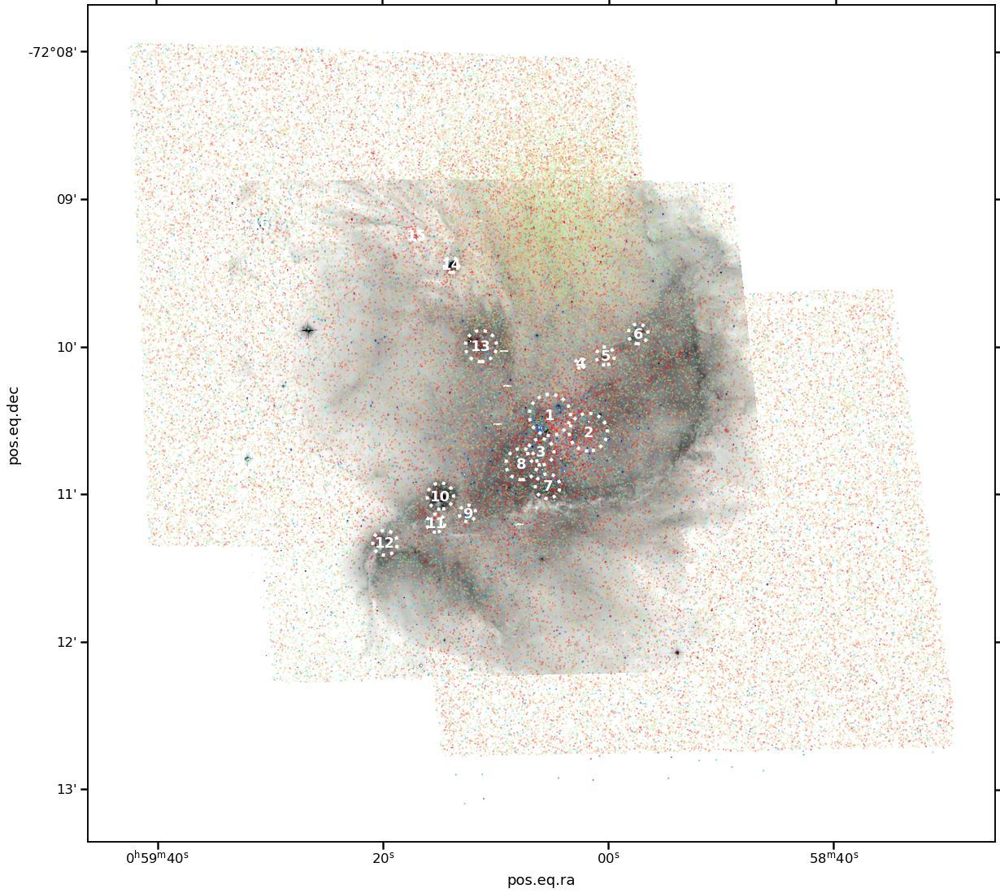

In [152]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-1.0, vmax=0.3, 
    cmap="gray_r",
)
points = ax.scatter(
    stars['ra'].data, 
    stars['dec'].data, 
    c=stars["V-I"].data,
    s=1.0/(stars["F555W"] - 12.0),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
#fig.colorbar(points, ax=ax, label="$V - I$", shrink=0.8)
#gpoints = ax.scatter(
#    x="ra", y="dec", 
#    edgecolors="w", 
#    data=dfgaia,
#    s=120/(dfgaia["phot_g_mean_mag"] - 13), 
#    alpha=1.0,
#    linewidth=1.5,
#    facecolor="none",
#    transform=ax.get_transform('world'),
#)
#ax.plot(ra0, dec0, 'kx', markersize=20, transform=ax.get_transform('world'),)

for data in subclusters:
    circ = SphericalCircle(
        (data["ra"]*u.deg, data["dec"]*u.deg), 
        data["R"]*u.arcsec,
        edgecolor='w', facecolor='none', 
        linestyle="dotted",
        linewidth=4,
        transform=ax.get_transform("world"),
    )
    ax.add_patch(circ)
    ax.text(
        data["ra"], data["dec"], data["__SSN2007_"].split()[-1],
        ha="center", va="center", color="w",
        fontweight="black",
        transform=ax.get_transform("world"),
    )


#ax.set(
#    xlim=[x0 - dx, x0 + dx],
#    ylim=[y0 - dy, y0 + dy],
#);

<ipython-input-208-07c69dd4ca37>:6: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-208-07c69dd4ca37>:6: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


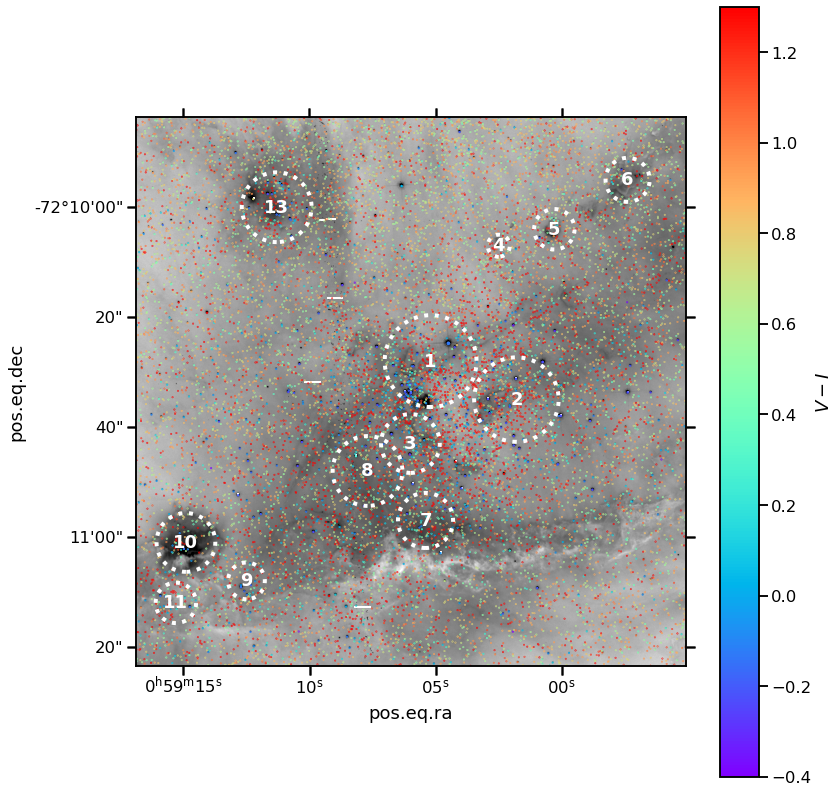

In [208]:
dx, dy = 1000, 1000

fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-1.0, vmax=0.3, 
    cmap="gray_r",
)
points = ax.scatter(
    stars['ra'].data, 
    stars['dec'].data, 
    c=stars["V-I"].data,
    s=3.0/(stars["F555W"] - 12.0),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
fig.colorbar(points, ax=ax, label="$V - I$", shrink=0.8)
#gpoints = ax.scatter(
#    x="ra", y="dec", 
#    edgecolors="w", 
#    data=dfgaia,
#    s=120/(dfgaia["phot_g_mean_mag"] - 13), 
#    alpha=1.0,
#    linewidth=1.5,
#    facecolor="none",
#    transform=ax.get_transform('world'),
#)
#ax.plot(ra0, dec0, 'kx', markersize=20, transform=ax.get_transform('world'),)

for data in subclusters:
    circ = SphericalCircle(
        (data["ra"]*u.deg, data["dec"]*u.deg), 
        data["R"]*u.arcsec,
        edgecolor='w', facecolor='none', 
        linestyle="dotted",
        linewidth=4,
        transform=ax.get_transform("world"),
    )
    ax.add_patch(circ)
    ax.text(
        data["ra"], data["dec"], data["__SSN2007_"].split()[-1],
        ha="center", va="center", color="w",
        fontweight="black",
        transform=ax.get_transform("world"),
        clip_on=True,
    )


ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
)
fig.tight_layout();

In [166]:
dx, dy = 400, 400

<ipython-input-170-42c1320da0c8>:4: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-170-42c1320da0c8>:4: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
<ipython-input-170-42c1320da0c8>:55: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout();
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


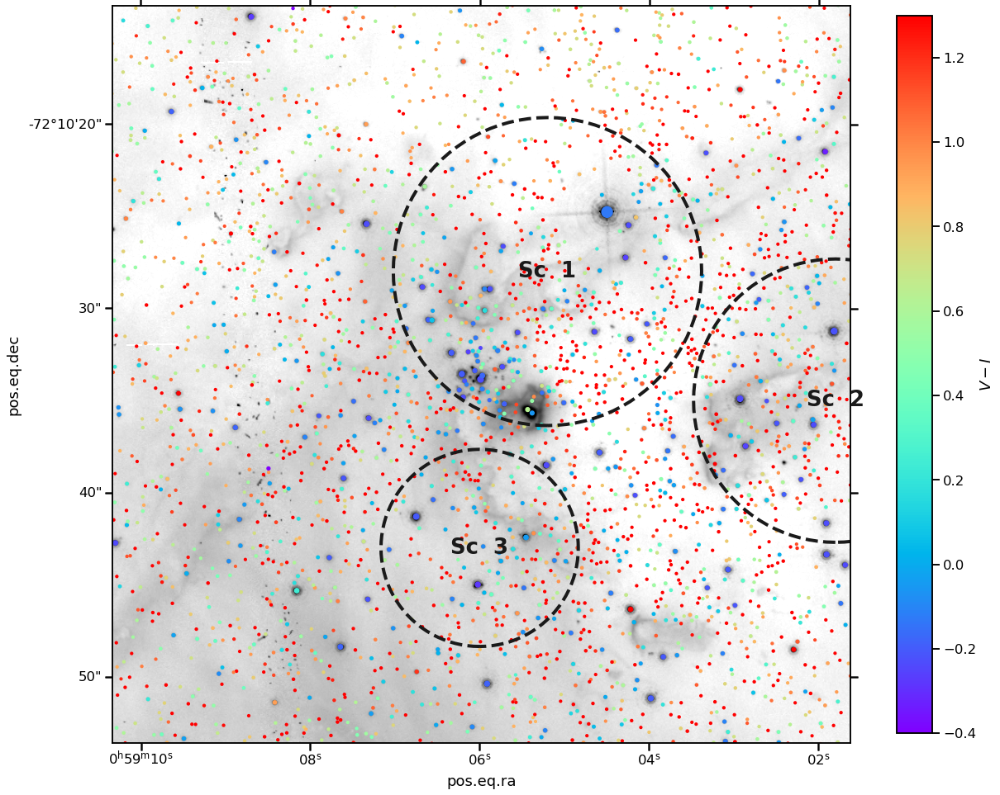

In [170]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-0.5, vmax=0.8, 
    cmap="gray_r",
)
points = ax.scatter(
    stars['ra'].data, 
    stars['dec'].data, 
    c=stars["V-I"].data,
    s=100.0/(stars["F555W"] - 12.0),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
fig.colorbar(points, ax=ax, label="$V - I$", shrink=0.8)
#gpoints = ax.scatter(
#    x="ra", y="dec", 
#    edgecolors="w", 
#    data=dfgaia,
#    s=120/(dfgaia["phot_g_mean_mag"] - 13), 
#    alpha=1.0,
#    linewidth=1.5,
#    facecolor="none",
#    transform=ax.get_transform('world'),
#)
#ax.plot(ra0, dec0, 'kx', markersize=20, transform=ax.get_transform('world'),)

for data in subclusters[0:3]:
    circ = SphericalCircle(
        (data["ra"]*u.deg, data["dec"]*u.deg), 
        data["R"]*u.arcsec,
        edgecolor='k', facecolor='none', 
        linestyle="dashed",
        linewidth=4,
        clip_on=True,
        transform=ax.get_transform("world"),
    )
    ax.add_patch(circ)
    ax.text(
        data["ra"], data["dec"], data["__SSN2007_"],
        ha="center", va="center", color="k",
        fontweight="black", fontsize="x-large",
        transform=ax.get_transform("world"),
    )


ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
)
fig.tight_layout();

## Try and apply CMD cuts to isolate YSOs

Annoyingly, the catalog does not include the estimated age of the stars.  

But it looks like $V < 20 + 4 (V - I)$ would make a good cut.  This would select the upper main sequence plus the young stars above the lower main sequence (plus evolved stars, but there shouldn't be many of those).

In [178]:
mcut = stars["F555W"] < 20.0 + 4*stars["V-I"]

In [179]:
mcut.sum(), (~mcut).sum()

(14112, 65848)

In [182]:
ystars = stars[mcut][::-1]
ystars

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32
28886,26.821,0.088,24.687,0.035,00 58 32.111,-72 12 24.82,--,14.633868,-72.206894,2.134,0.095
27015,26.777,0.094,24.894,0.038,00 58 40.657,-72 11 18.04,--,14.669477,-72.188344,1.883,0.101
26963,26.772,0.089,24.982,0.034,00 58 45.033,-72 09 59.88,--,14.687710,-72.166633,1.790,0.095
26484,26.757,0.086,24.837,0.030,00 58 45.703,-72 11 28.08,--,14.690502,-72.191133,1.920,0.091
26297,26.756,0.096,25.016,0.035,00 58 38.646,-72 11 30.56,--,14.661098,-72.191822,1.740,0.102
24038,26.692,0.078,25.005,0.044,00 58 34.854,-72 10 10.32,--,14.645298,-72.169533,1.687,0.090
23780,26.687,0.091,24.905,0.051,00 58 34.378,-72 10 35.65,--,14.643314,-72.176569,1.782,0.104
23659,26.683,0.080,24.750,0.047,00 58 38.873,-72 12 42.07,--,14.662043,-72.211686,1.933,0.093


In [192]:
lmsstars = stars[~mcut]

<ipython-input-237-589de409dd2e>:5: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-237-589de409dd2e>:5: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


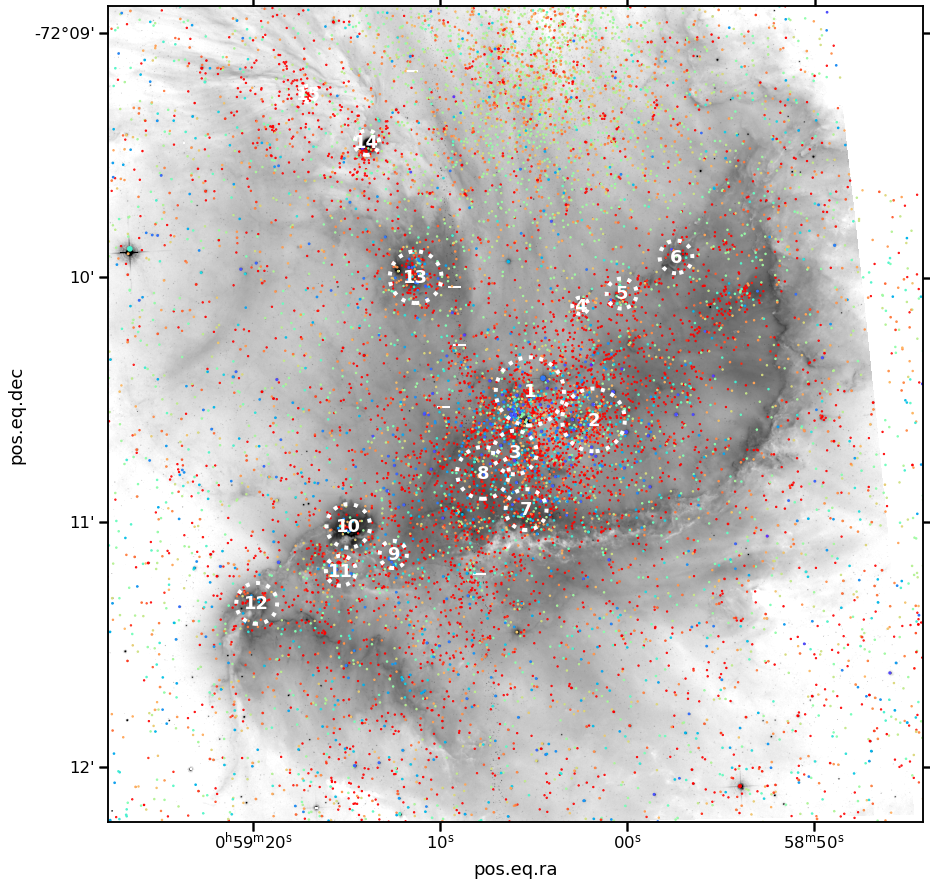

In [237]:
dx, dy = 2000, 2000
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-1.0, vmax=0.3, 
    cmap="gray_r",
)
points = ax.scatter(
    ystars['ra'].data, 
    ystars['dec'].data, 
    c=ystars["V-I"].data,
    s=10.0/(ystars["F555W"] - 12.0),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
#fig.colorbar(points, ax=ax, label="$V - I$", shrink=0.8)
#gpoints = ax.scatter(
#    x="ra", y="dec", 
#    edgecolors="w", 
#    data=dfgaia,
#    s=120/(dfgaia["phot_g_mean_mag"] - 13), 
#    alpha=1.0,
#    linewidth=1.5,
#    facecolor="none",
#    transform=ax.get_transform('world'),
#)
#ax.plot(ra0, dec0, 'kx', markersize=20, transform=ax.get_transform('world'),)

for data in subclusters:
    circ = SphericalCircle(
        (data["ra"]*u.deg, data["dec"]*u.deg), 
        data["R"]*u.arcsec,
        edgecolor='w', facecolor='none', 
        linestyle="dotted",
        linewidth=4,
        transform=ax.get_transform("world"),
    )
    ax.add_patch(circ)
    ax.text(
        data["ra"], data["dec"], data["__SSN2007_"].split()[-1],
        ha="center", va="center", color="w",
        fontweight="black",
        clip_on=True,
        transform=ax.get_transform("world"),
    )



ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
)
#fig.tight_layout();
fig.savefig("../figs/ngc-346-star-map-zoom-A.pdf");

/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


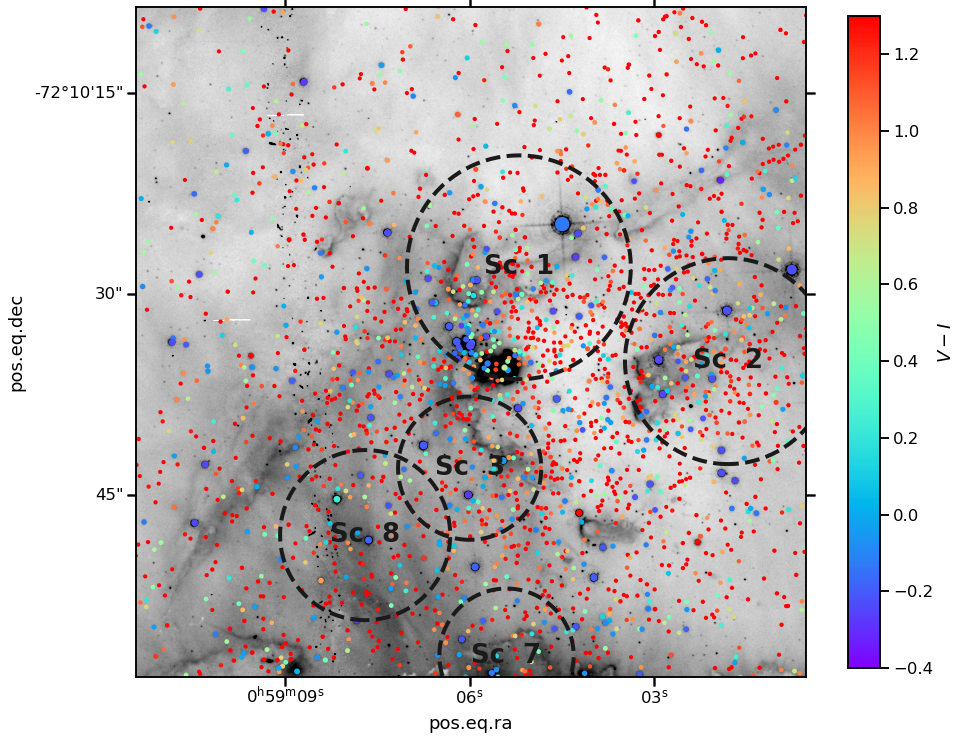

In [238]:
dx, dy = 500, 500
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    imha, 
    vmin=0.2, vmax=1.0, 
    cmap="gray_r",
)
points = ax.scatter(
    ystars['ra'].data, 
    ystars['dec'].data, 
    c=ystars["V-I"].data,
    s=100.0/(ystars["F555W"] - 12.0),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
fig.colorbar(points, ax=ax, label="$V - I$", shrink=0.8)

for data in subclusters[[0, 1, 2, 6, 7]]:
    circ = SphericalCircle(
        (data["ra"]*u.deg, data["dec"]*u.deg), 
        data["R"]*u.arcsec,
        edgecolor='k', facecolor='none', 
        linestyle="dashed",
        linewidth=4,
        clip_on=True,
        transform=ax.get_transform("world"),
    )
    ax.add_patch(circ)
    ax.text(
        data["ra"], data["dec"], data["__SSN2007_"],
        ha="center", va="center", color="k",
        fontweight="black", fontsize="x-large",
        transform=ax.get_transform("world"),
    )



ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
)
fig.savefig("../figs/ngc-346-star-map-zoom-B.pdf")

<ipython-input-239-e8d5216849b5>:5: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-239-e8d5216849b5>:5: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


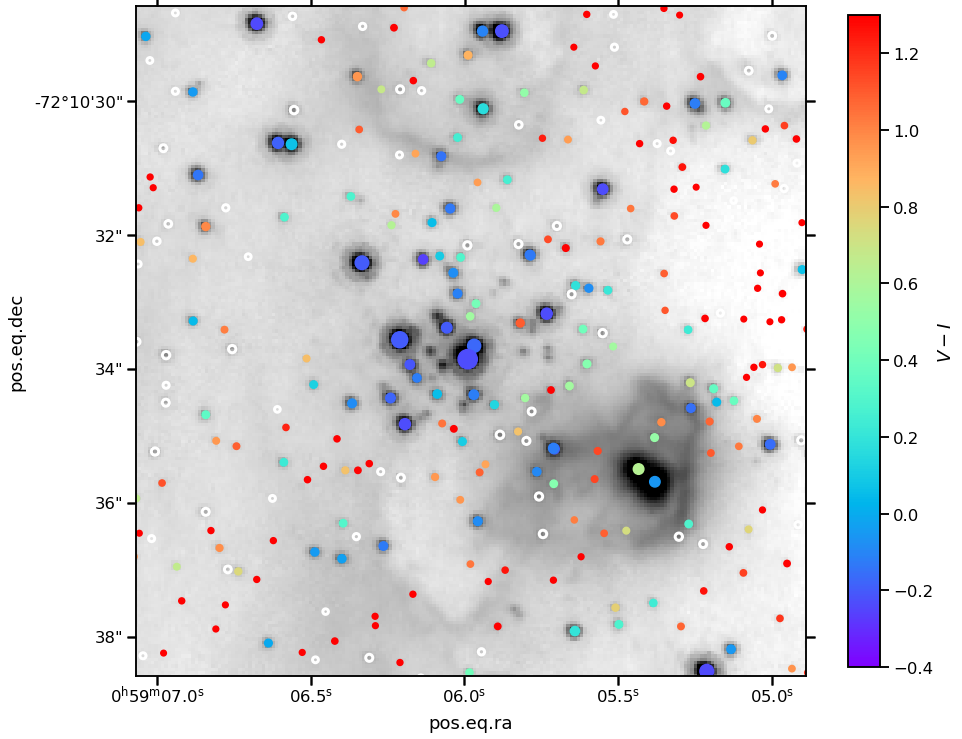

In [239]:
dx, dy = 100, 100
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-0.5, vmax=1.0, 
    cmap="gray_r",
)
points = ax.scatter(
    ystars['ra'].data, 
    ystars['dec'].data, 
    c=ystars["V-I"].data,
    s=400.0/(ystars["F555W"] - 13.0),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
fig.colorbar(points, ax=ax, label="$V - I$", shrink=0.8)

points2 = ax.scatter(
    lmsstars['ra'].data, 
    lmsstars['dec'].data, 
    edgecolors="w",
    facecolor="none",
    s=400.0/(lmsstars["F555W"] - 13.0),
    alpha=1.0,
    linewidth=3,
    transform=ax.get_transform('world'),    
)


ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
)
fig.savefig("../figs/ngc-346-star-map-zoom-C.pdf");

<ipython-input-221-9c65620f6401>:7: RuntimeWarning: invalid value encountered in sqrt
  np.sqrt(imha),
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
<ipython-input-221-9c65620f6401>:40: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout();
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


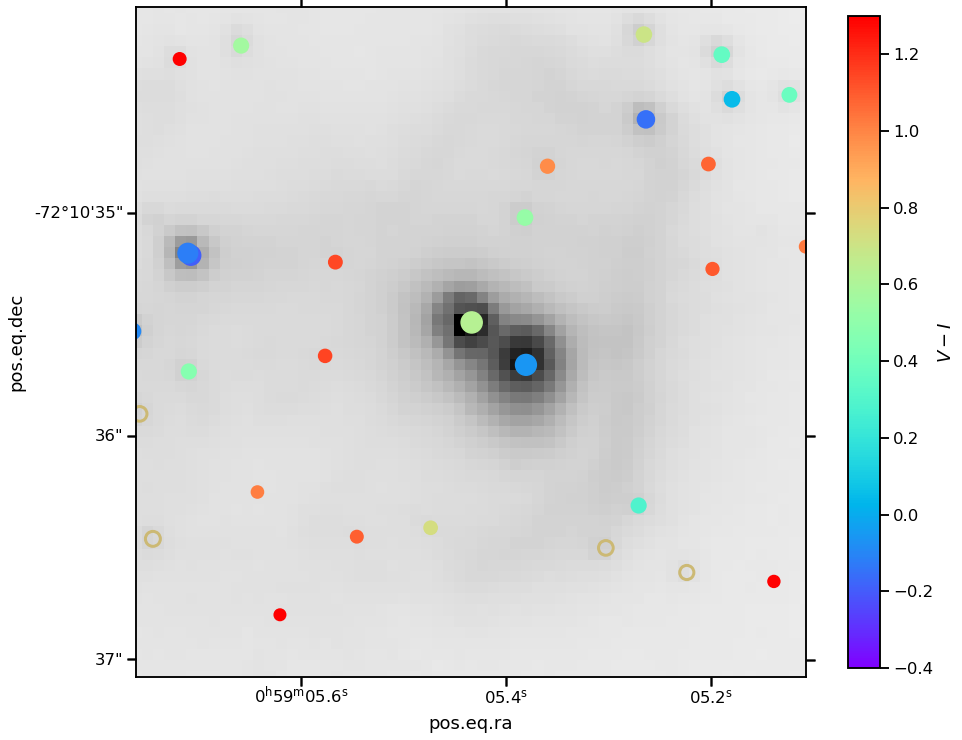

In [221]:
dx, dy = 30, 30
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
#    np.log10(imha), 
#    vmin=-0.5, vmax=2.0, 
    np.sqrt(imha), 
    vmin=0.0, vmax=8.0, 
    cmap="gray_r",
)
points = ax.scatter(
    ystars['ra'].data, 
    ystars['dec'].data, 
    c=ystars["V-I"].data,
    s=4*400.0/(ystars["F555W"] - 13.0),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
fig.colorbar(points, ax=ax, label="$V - I$", shrink=0.8)

points2 = ax.scatter(
    lmsstars['ra'].data, 
    lmsstars['dec'].data, 
    edgecolors="y",
    facecolor="none",
    s=4*400.0/(lmsstars["F555W"] - 13.0),
    linewidth=3,
    alpha=1.0,
    transform=ax.get_transform('world'),    
)


ax.set(
    xlim=[x0 + 50 - dx, x0 + 50 + dx],
    ylim=[y0 - 40 - dy, y0 - 40 + dy],
)
fig.tight_layout();

## Better cuts in the CMD

Actually, it turns out that Gouliermis:2006h already have the regions defined for UMS, LMS, PMS, and RGB.  So we should use those. 

First, let's plot the CMD to look at it.

[(-1.5, 3.0), (27.0, 13.0)]

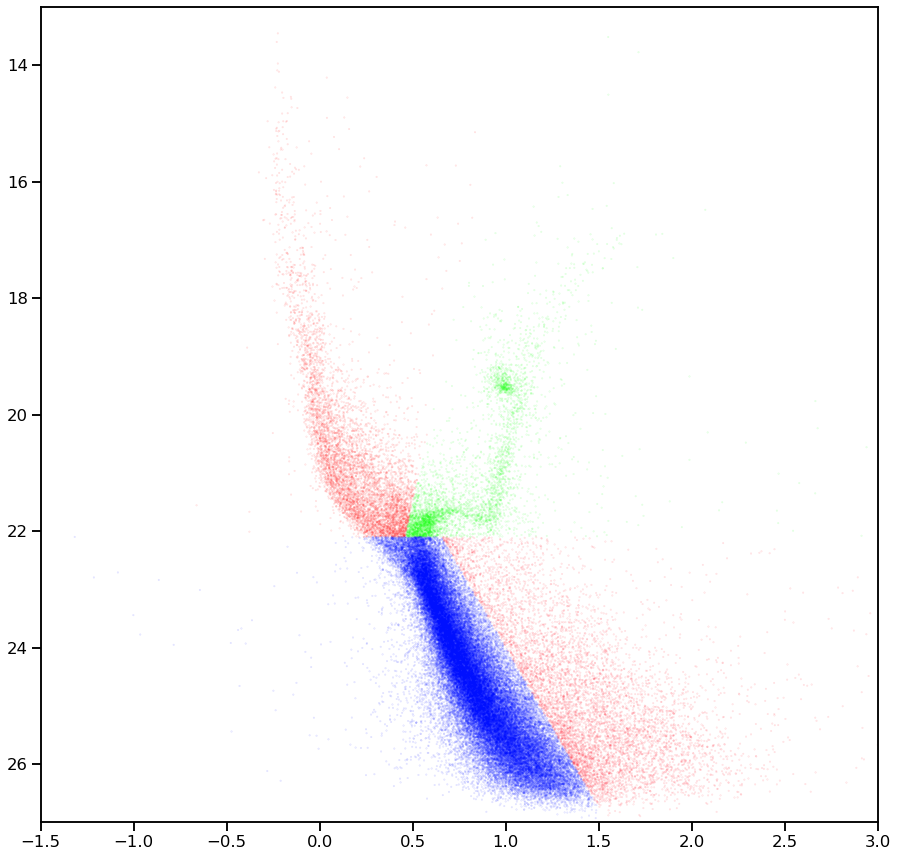

In [256]:
mag0 = 22.1
mUMS = (stars["F555W"] < mag0) & (stars["F555W"] < 29 - 15 * stars["V-I"])
mRGB = (stars["F555W"] < mag0) & (stars["F555W"] >= 29 - 15 * stars["V-I"])
mLMS = (stars["F555W"] >= mag0) & (stars["F555W"] > 18.5 + 5.5 * stars["V-I"])
mPMS = (stars["F555W"] >= mag0) & (stars["F555W"] <= 18.5 + 5.5 * stars["V-I"])


stars['reg'] = 0.0
stars['reg'][mUMS] = 1.0
stars['reg'][mRGB] = 2.0
stars['reg'][mLMS] = 3.0
stars['reg'][mPMS] = 4.0


fig, ax = plt.subplots(figsize=(15, 15))
ax.scatter(
    stars["V-I"],
    stars["F555W"],
    marker=".",
    s=1,
    c=stars['reg'],
    alpha=0.15,
    cmap="hsv",
)
ax.set(
    xlim=[-1.5, 3.0],
    ylim=[27.0, 13.0],
)

In [258]:
ystars = stars[mPMS | mUMS][::-1]
ystars

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I,reg
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag,
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32,int64
31969,26.895,0.098,25.172,0.048,00 59 29.197,-72 10 37.82,--,14.871727,-72.177172,1.723,0.109,4
31212,26.880,0.095,25.328,0.054,00 58 31.282,-72 12 21.38,--,14.630414,-72.205939,1.552,0.109,4
30948,26.874,0.091,25.156,0.044,00 58 44.130,-72 10 57.57,--,14.683948,-72.182658,1.718,0.101,4
29495,26.842,0.098,25.283,0.050,00 59 31.898,-72 09 48.61,--,14.882981,-72.163503,1.559,0.110,4
28886,26.821,0.088,24.687,0.035,00 58 32.111,-72 12 24.82,--,14.633868,-72.206894,2.134,0.095,4
28868,26.826,0.088,25.213,0.039,00 58 52.266,-72 11 40.15,--,14.717848,-72.194486,1.613,0.096,4
28153,26.807,0.092,25.219,0.043,00 58 48.063,-72 11 00.36,--,14.700335,-72.183433,1.588,0.102,4
28031,26.793,0.099,25.240,0.041,00 58 37.413,-72 12 25.31,--,14.655960,-72.207031,1.553,0.107,4


In [259]:
lmsstars = stars[mLMS]
rgbstars = stars[mRGB]

<ipython-input-343-0ef9476adf3e>:5: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-343-0ef9476adf3e>:5: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


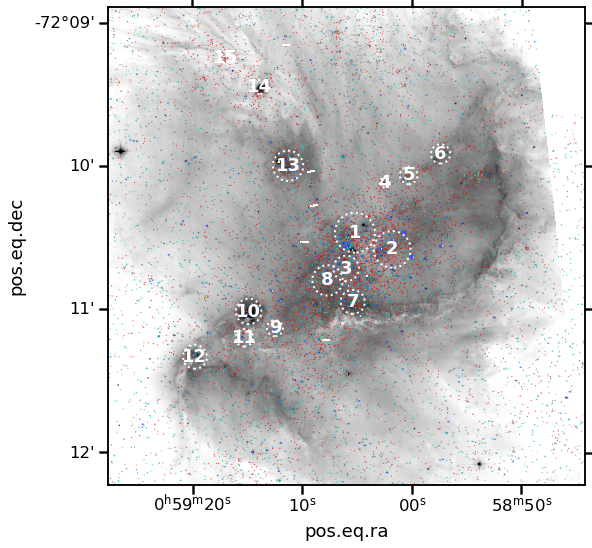

In [343]:
dx, dy = 2000, 2000
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-1.0, vmax=0.3, 
    cmap="gray_r",
)
points = ax.scatter(
    ystars['ra'].data, 
    ystars['dec'].data, 
    c=ystars["V-I"].data,
    s=10.0/(ystars["F555W"] - 13.0),
    edgecolors="k",
    lw=0.05,
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
#fig.colorbar(points, ax=ax, label="$V - I$", shrink=0.8)
#gpoints = ax.scatter(
#    x="ra", y="dec", 
#    edgecolors="w", 
#    data=dfgaia,
#    s=120/(dfgaia["phot_g_mean_mag"] - 13), 
#    alpha=1.0,
#    linewidth=1.5,
#    facecolor="none",
#    transform=ax.get_transform('world'),
#)
#ax.plot(ra0, dec0, 'kx', markersize=20, transform=ax.get_transform('world'),)

for data in subclusters:
    circ = SphericalCircle(
        (data["ra"]*u.deg, data["dec"]*u.deg), 
        data["R"]*u.arcsec,
        edgecolor='w', facecolor='none', 
        linestyle="dotted",
        linewidth=2,
        transform=ax.get_transform("world"),
    )
    ax.add_patch(circ)
    ax.text(
        data["ra"], data["dec"], data["__SSN2007_"].split()[-1],
        ha="center", va="center", color="w",
        fontweight="black",
        clip_on=True,
        transform=ax.get_transform("world"),
    )



ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
)
fig.tight_layout();
fig.savefig("../figs/ngc-346-star-map-zoom-A.pdf");

Also indicate the coordinates of Source C from Table 1 of Rubio:2018f, which come from near-IR imaging.

In [358]:
c0_fk5 = SkyCoord(
    "00 59 05.43",
    "-72 10 35.5",
    unit=(u.hourangle, u.deg),
    frame="fk5",
)

In [359]:
c0_fk5

<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (14.772625, -72.17652778)>

In [375]:
c0 = c0_fk5.icrs
c0

<SkyCoord (ICRS): (ra, dec) in deg
    (14.77263727, -72.17652881)>

In [382]:
c0.ra.to_string(u.hourangle), c0.dec.to_string(u.deg)

('0h59m05.4329s', '-72d10m35.5037s')

Note that I have converted the coordinates from J2000 (as stated in Rubio:2018f) to ICRS for consistency with the Gaia frame.  But this makes a difference of only 0.01 arcsec, whereas the precision of the data is only 0.1 arcsec (based on significant figures given, who knows wjat the accuracy is).

/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
<ipython-input-393-78004244589c>:59: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout()
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


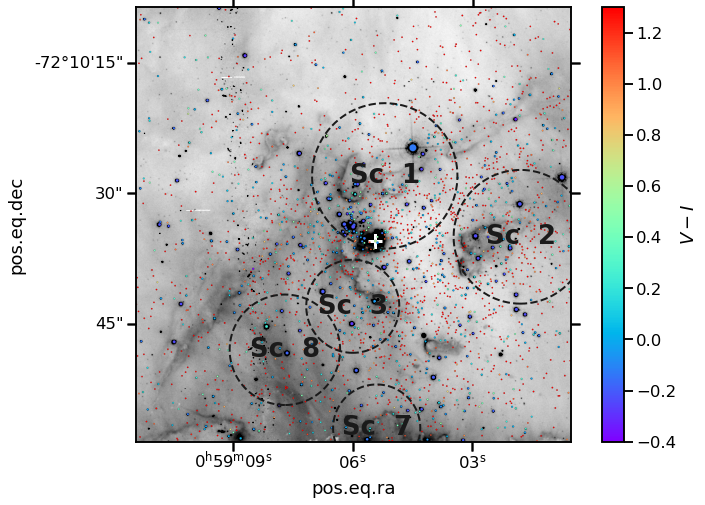

In [393]:
dx, dy = 500, 500
fig = plt.figure(figsize=(11, 8))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    imha, 
    vmin=0.2, vmax=1.0, 
    cmap="gray_r",
)

irpoint = ax.scatter(
    c0.ra.deg,
    c0.dec.deg,
    marker="+",
    s=200,
    c="w",
    linewidth=3,
    transform=ax.get_transform('world'), 
)

points = ax.scatter(
    ystars['ra'].data, 
    ystars['dec'].data, 
    c=ystars["V-I"].data,
    s=30.0/(ystars["F555W"] - 12.0),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    edgecolors="k",
    linewidth=0.1,
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
fig.colorbar(points, ax=ax, label="$V - I$", shrink=1.0)

for data in subclusters[[0, 1, 2, 6, 7]]:
    circ = SphericalCircle(
        (data["ra"]*u.deg, data["dec"]*u.deg), 
        data["R"]*u.arcsec,
        edgecolor='k', facecolor='none', 
        linestyle="dashed",
        linewidth=2,
        clip_on=True,
        transform=ax.get_transform("world"),
    )
    ax.add_patch(circ)
    ax.text(
        data["ra"], data["dec"], data["__SSN2007_"],
        ha="center", va="center", color="k",
        fontweight="black", fontsize="x-large",
        transform=ax.get_transform("world"),
    )



ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
)
fig.tight_layout()
fig.savefig("../figs/ngc-346-star-map-zoom-B.pdf")

<ipython-input-367-9626a915e77c>:5: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-367-9626a915e77c>:5: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
<ipython-input-367-9626a915e77c>:62: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout()
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._fac

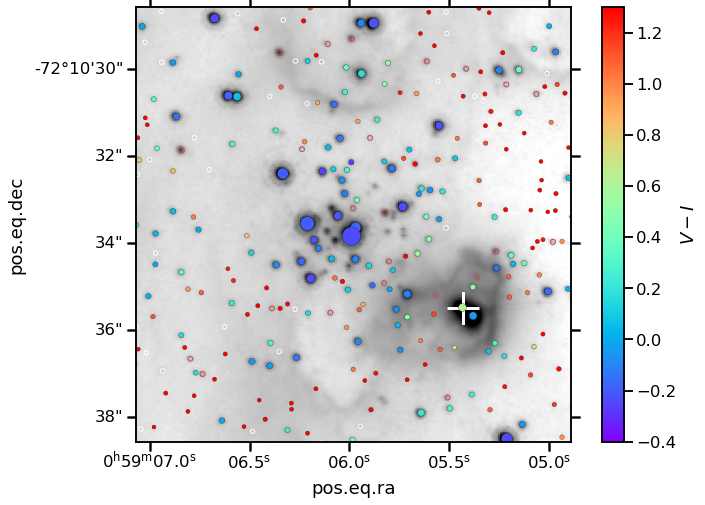

In [367]:
dx, dy = 100, 100
fig = plt.figure(figsize=(11, 8))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-0.5, vmax=1.0, 
    cmap="gray_r",
)


irpoint = ax.scatter(
    c0.ra.deg,
    c0.dec.deg,
    marker="+",
    s=1000,
    c="w",
    linewidth=3,
    transform=ax.get_transform('world'), 
)

points = ax.scatter(
    ystars['ra'].data, 
    ystars['dec'].data, 
    c=ystars["V-I"].data,
    s=200.0/(ystars["F555W"] - 13.5),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    edgecolors="k",
    linewidth=0.3,
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
fig.colorbar(points, ax=ax, label="$V - I$", shrink=1.0)

points2 = ax.scatter(
    lmsstars['ra'].data, 
    lmsstars['dec'].data, 
    edgecolors="w",
    facecolor="none",
    s=200.0/(lmsstars["F555W"] - 13.5),
    alpha=1.0,
    linewidth=1,
    transform=ax.get_transform('world'),    
)

points3 = ax.scatter(
    rgbstars['ra'].data, 
    rgbstars['dec'].data, 
    edgecolors="r",
    facecolor="none",
    s=200.0/(rgbstars["F555W"] - 13.5),
    linewidth=1,
    alpha=1.0,
    transform=ax.get_transform('world'),    
)

ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
)
fig.tight_layout()
fig.savefig("../figs/ngc-346-star-map-zoom-C.pdf");

<ipython-input-366-717af2560fc8>:7: RuntimeWarning: invalid value encountered in sqrt
  np.sqrt(imha),
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
<ipython-input-366-717af2560fc8>:63: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout();
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


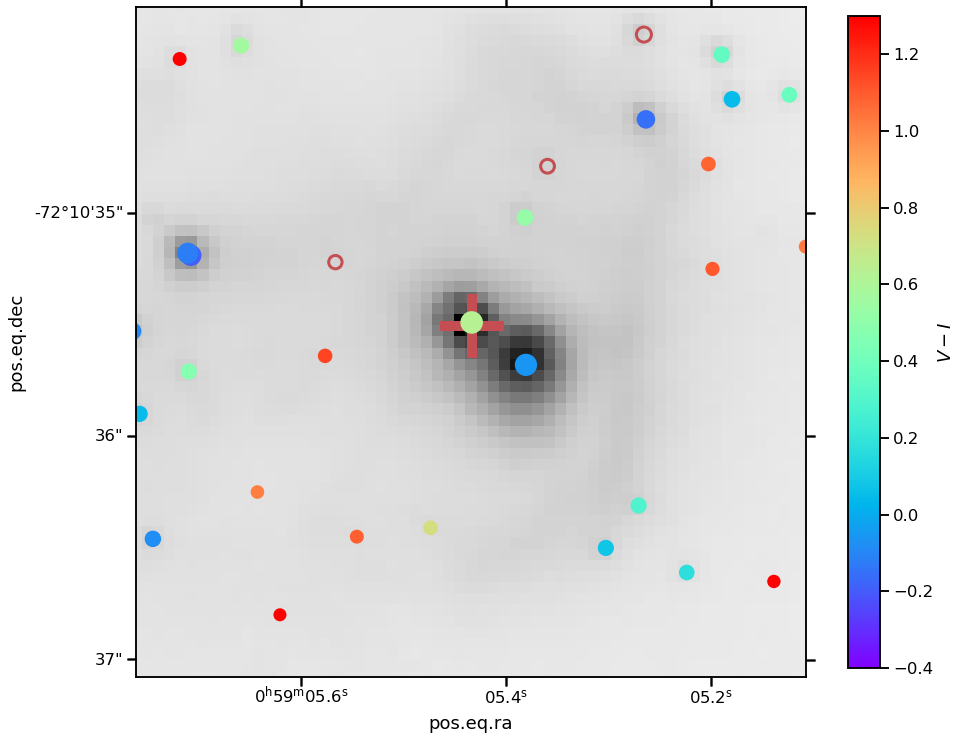

In [366]:
dx, dy = 30, 30
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
#    np.log10(imha), 
#    vmin=-0.5, vmax=2.0, 
    np.sqrt(imha), 
    vmin=0.0, vmax=8.0, 
    cmap="gray_r",
)

irpoint = ax.scatter(
    c0.ra.deg,
    c0.dec.deg,
    marker="+",
    s=4*1000,
    c="r",
    linewidth=10,
    transform=ax.get_transform('world'), 
)


points = ax.scatter(
    ystars['ra'].data, 
    ystars['dec'].data, 
    c=ystars["V-I"].data,
    s=4*400.0/(ystars["F555W"] - 13.0),
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
fig.colorbar(points, ax=ax, label="$V - I$", shrink=0.8)

points2 = ax.scatter(
    lmsstars['ra'].data, 
    lmsstars['dec'].data, 
    edgecolors="y",
    facecolor="none",
    s=4*400.0/(lmsstars["F555W"] - 13.0),
    linewidth=3,
    alpha=1.0,
    transform=ax.get_transform('world'),    
)
points3 = ax.scatter(
    rgbstars['ra'].data, 
    rgbstars['dec'].data, 
    edgecolors="r",
    facecolor="none",
    s=4*400.0/(rgbstars["F555W"] - 13.0),
    linewidth=3,
    alpha=1.0,
    transform=ax.get_transform('world'),    
)



ax.set(
    xlim=[x0 + 50 - dx, x0 + 50 + dx],
    ylim=[y0 - 40 - dy, y0 - 40 + dy],
)
fig.tight_layout();

So, it doesn't make much difference really, but it is good to do the cuts properly.  We do see quite a lot of the RGB-area sources, but these might not be RGB, but instead could be intermediate-mass young stars

## Look at CMD of the central cluster

We can take a cut in RA and Dec. 

In [266]:
x0, y0

(2600, 2200)

In [271]:
w.pixel_to_world_values(x0, y0)

(array(14.77491115), array(-72.17599396))

In [274]:
dx, dy = 100, 100
ra1, dec1 = w.pixel_to_world_values(x0 + dx, y0 - dy)
ra2, dec2 = w.pixel_to_world_values(x0 - dx, y0 + dy)

mbox = (
    (stars["ra"] >= ra1)
    & (stars["ra"] <= ra2)
    & (stars["dec"] >= dec1)
    & (stars["dec"] <= dec2)
)
boxstars = stars[mbox]
boxstars

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I,reg
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag,
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32,int64
14,14.090,0.003,14.318,0.004,00 59 05.972,-72 10 33.85,--,14.774956,-72.176069,-0.228,0.005,1
22,14.562,0.004,14.757,0.005,00 59 06.193,-72 10 33.56,476,14.775877,-72.175989,-0.195,0.006,1
40,15.131,0.005,15.365,0.006,00 59 05.194,-72 10 38.51,451,14.771714,-72.177364,-0.234,0.008,1
43,15.185,0.005,15.382,0.006,00 59 06.316,-72 10 32.41,481,14.776389,-72.175669,-0.197,0.008,1
49,15.358,0.005,15.530,0.007,00 59 05.951,-72 10 33.65,--,14.774868,-72.176014,-0.172,0.009,1
62,15.614,0.006,15.836,0.007,00 59 05.861,-72 10 28.95,468,14.774493,-72.174708,-0.222,0.009,1
105,16.168,0.008,16.403,0.010,00 59 06.658,-72 10 28.84,486,14.777814,-72.174678,-0.235,0.013,1
118,16.298,0.008,16.529,0.011,00 59 05.715,-72 10 33.17,--,14.773885,-72.175881,-0.231,0.014,1


[(-1.5, 3.0), (27.0, 13.0)]

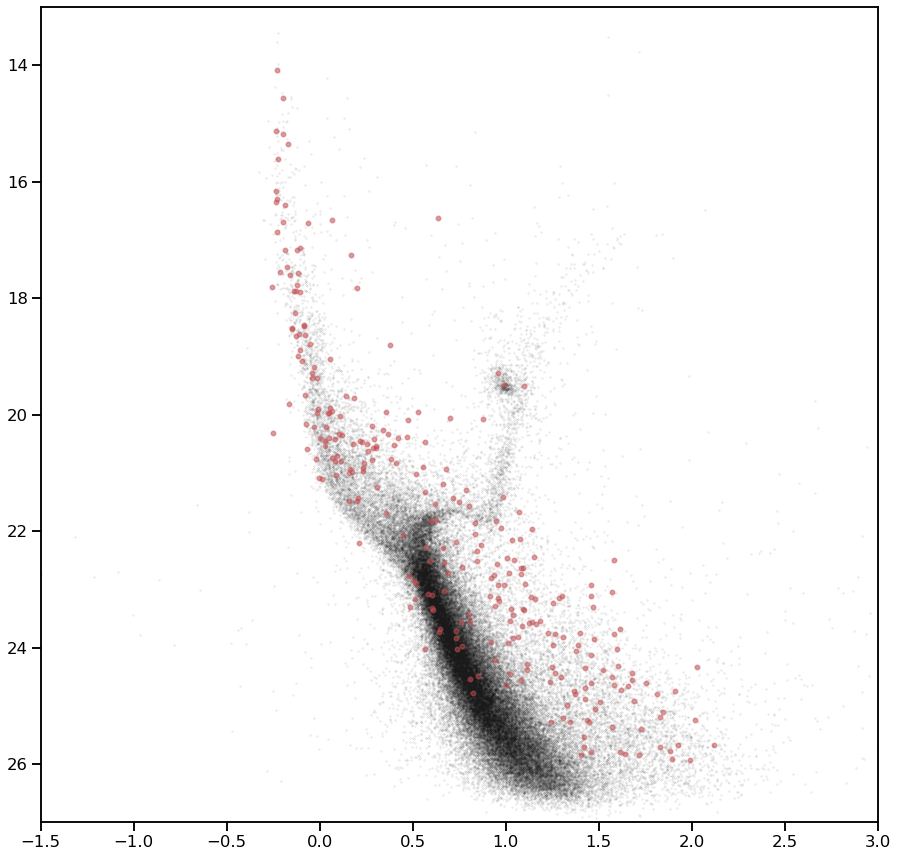

In [275]:
fig, ax = plt.subplots(figsize=(15, 15))
ax.scatter(
    stars["V-I"],
    stars["F555W"],
    marker=".",
    s=1,
    c="k",
    alpha=0.15,
    cmap="hsv",
)

ax.scatter(
    boxstars["V-I"],
    boxstars["F555W"],
    marker="o",
    s=20,
    c="r",
    alpha=0.5,
)


ax.set(
    xlim=[-1.5, 3.0],
    ylim=[27.0, 13.0],
)

In [277]:
mYSO = (
    (stars["F555W"] < 17) 
    & (stars["V-I"] > 0.5)
    & (stars["V-I"] < 1.0)
)
stars[mYSO]

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I,reg
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag,
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32,int64
4,12.326,0.001,11.793,0.001,00 58 42.424,-72 09 43.27,185,14.676839,-72.162019,0.533,0.001,1
42,15.151,0.005,14.316,0.004,00 58 42.286,-72 10 24.49,182,14.676264,-72.173469,0.835,0.006,1
69,15.720,0.006,15.146,0.005,00 58 35.548,-72 09 44.83,133,14.648189,-72.162453,0.574,0.008,1
70,15.724,0.006,14.992,0.005,00 59 18.698,-72 10 54.74,684,14.827981,-72.181872,0.732,0.008,1
98,16.055,0.007,15.245,0.006,00 59 05.872,-72 11 27.06,466,14.774539,-72.190850,0.810,0.009,1
152,16.617,0.009,15.983,0.008,00 59 05.416,-72 10 35.49,454,14.772639,-72.176525,0.634,0.012,1
153,16.620,0.009,15.800,0.007,00 59 26.717,-72 09 25.08,--,14.861393,-72.156967,0.820,0.011,1
170,16.722,0.010,15.978,0.008,00 59 12.210,-72 09 58.53,605,14.800948,-72.166258,0.744,0.013,1


Looks like ID152, which is MPG454 is our star!

And find the separation of each other star from infrared source C, which we calculated earlier.

In [363]:
boxstars["sep"] = SkyCoord(
    boxstars["ra"], boxstars["dec"], unit=u.deg
).separation(c0).to(u.arcsec)
boxstars["sep"].format = "{:.2f}"

Now put them in order of that separation:

In [364]:
boxstars.sort("sep")
boxstars

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I,reg,sep
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag,,arcsec
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32,int64,float64
152,16.617,0.009,15.983,0.008,00 59 05.416,-72 10 35.49,454,14.772639,-72.176525,0.634,0.012,1,0.01
168,16.713,0.010,16.774,0.013,00 59 05.363,-72 10 35.68,--,14.772418,-72.176578,-0.061,0.016,1,0.30
2557,19.958,0.022,19.430,0.043,00 59 05.364,-72 10 35.02,--,14.772423,-72.176394,0.528,0.048,1,0.54
14737,22.440,0.077,21.289,0.081,00 59 05.559,-72 10 35.64,--,14.773235,-72.176567,1.151,0.112,4,0.67
10294,21.963,0.086,20.820,0.077,00 59 05.549,-72 10 35.22,--,14.773193,-72.176450,1.143,0.115,2,0.68
6398,21.419,0.043,20.432,0.057,00 59 05.342,-72 10 34.79,--,14.772331,-72.176331,0.987,0.071,2,0.79
12249,22.184,0.082,21.449,0.033,00 59 05.456,-72 10 36.41,--,14.772806,-72.176781,0.735,0.088,4,0.93
27686,23.339,0.057,22.247,0.035,00 59 05.528,-72 10 36.45,--,14.773106,-72.176792,1.092,0.067,4,1.08


This shows that the "other" star is ID168, which doesn't have an MPG number.  Although MPG did not have the resolution to distinguish between the two sources, which are separated by 0.3 arcsec. 

Note that the identification of these two stars (152 and 168) was already mentioned in Sec 2.3, para 1 of Rubio:2018f

The NE star (we could call it MPG454-NE) is within 0.02 arcsec of the IR source, which is coincident within the astrometric precision.

Now, we can redo the CMD, but showing the separation with symbol color.

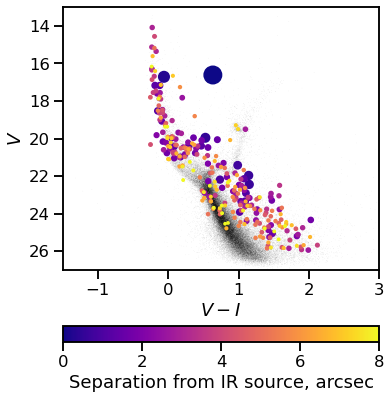

In [365]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(
    stars["V-I"],
    stars["F555W"],
    marker=".",
    edgecolors="none",
    s=1,
    c="k",
    alpha=0.15,
    cmap="hsv",
)

points = ax.scatter(
    boxstars["V-I"],
    boxstars["F555W"],
    marker="o",
    s=50/(0.15 + boxstars["sep"]),
    c=boxstars["sep"],
    cmap="plasma",
    vmin=0.0,
    vmax=8.0,
    alpha=1.0,
)
fig.colorbar(
    points, ax=ax,
    orientation="horizontal",
    label="Separation from IR source, arcsec"
)

ax.set(
    xlim=[-1.5, 3.0],
    ylim=[27.0, 13.0],
    xlabel="$V - I$",
    ylabel="$V$",
)
fig.tight_layout()
fig.savefig("../figs/ngc-346-cmd-zoom.pdf");

It is clear that the the closer stars to the IR source tend to be younger – they are further from the main sequence line.

Note that the Sun would have $V = 24$ at the distance of the SMC.

The reddest stars on MS have $V - I = 1.4$, which corresponds to $T_\mathrm{eff} \approx 4800$ K (see Fig 8 of Da-Rio:2010a). 

The reddest PMS stars in this area have $V - I = 2.2$, which corresponds to $T_\mathrm{eff} \approx 3800$ K.  



One of the young-looking stars has $V = 24$, $V - I = 2$. So, a bit more than $1\,L_\odot$ (because BC is bigger for cooler stars), and probably $T_\mathrm{eff} \approx 4100$ K. This could be a 0.6 Msun star that is less than 1 Myr old. 

Stars in the box that are also in the MPG catalog

In [437]:
boxstars[~boxstars["MPG"].mask]

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I,reg,sep
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag,,arcsec
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32,int64,float64
152,16.617,0.009,15.983,0.008,00 59 05.416,-72 10 35.49,454,14.772639,-72.176525,0.634,0.012,1,0.01
40,15.131,0.005,15.365,0.006,00 59 05.194,-72 10 38.51,451,14.771714,-72.177364,-0.234,0.008,1,3.17
122,16.353,0.008,16.586,0.011,00 59 06.176,-72 10 34.82,477,14.775806,-72.176339,-0.233,0.014,1,3.56
22,14.562,0.004,14.757,0.005,00 59 06.193,-72 10 33.56,476,14.775877,-72.175989,-0.195,0.006,1,4.06
43,15.185,0.005,15.382,0.006,00 59 06.316,-72 10 32.41,481,14.776389,-72.175669,-0.197,0.008,1,5.16
62,15.614,0.006,15.836,0.007,00 59 05.861,-72 10 28.95,468,14.774493,-72.174708,-0.222,0.009,1,6.87
105,16.168,0.008,16.403,0.010,00 59 06.658,-72 10 28.84,486,14.777814,-72.174678,-0.235,0.013,1,8.77


## Look at the brightest stars

At the separation column in to the full table:

In [383]:
stars["sep"] = SkyCoord(
    stars["ra"], stars["dec"], unit=u.deg
).separation(c0).to(u.arcsec)
stars["sep"].format = "{:.2f}"

In [387]:
mbright = stars["F555W"] < 17.0
mbright = mbright & mUMS
mbright.sum(), (~mbright).sum()

(187, 79773)

In [389]:
mblue = stars["V-I"] < 0.0
(mblue & mbright).sum()

146

In [390]:
obstars = stars[mbright & mblue]
obstars

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I,reg,sep
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag,,arcsec
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32,int64,float64
7,12.609,0.002,12.742,0.002,00 59 04.479,-72 10 24.77,435,14.768735,-72.173547,-0.133,0.003,1,11.56
9,13.454,0.002,13.679,0.003,00 59 00.743,-72 10 28.16,355,14.753168,-72.174489,-0.225,0.004,1,22.68
11,13.602,0.002,13.833,0.003,00 59 00.029,-72 10 37.96,342,14.750193,-72.177211,-0.231,0.004,1,24.85
13,13.972,0.002,14.197,0.003,00 58 57.368,-72 10 33.67,324,14.739106,-72.176019,-0.225,0.004,1,36.99
14,14.090,0.003,14.318,0.004,00 59 05.972,-72 10 33.85,--,14.774956,-72.176069,-0.228,0.005,1,3.04
15,14.113,0.003,14.332,0.004,00 59 01.799,-72 10 31.23,368,14.757568,-72.175342,-0.219,0.005,1,17.15
17,14.383,0.003,14.622,0.004,00 59 02.908,-72 10 34.90,396,14.762189,-72.176361,-0.239,0.005,1,11.53
18,14.470,0.003,14.672,0.004,00 59 06.732,-72 10 41.30,487,14.778123,-72.178139,-0.202,0.005,1,8.37


In [392]:
obstars[obstars["sep"] < 40.0]

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I,reg,sep
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag,,arcsec
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32,int64,float64
7,12.609,0.002,12.742,0.002,00 59 04.479,-72 10 24.77,435,14.768735,-72.173547,-0.133,0.003,1,11.56
9,13.454,0.002,13.679,0.003,00 59 00.743,-72 10 28.16,355,14.753168,-72.174489,-0.225,0.004,1,22.68
11,13.602,0.002,13.833,0.003,00 59 00.029,-72 10 37.96,342,14.750193,-72.177211,-0.231,0.004,1,24.85
13,13.972,0.002,14.197,0.003,00 58 57.368,-72 10 33.67,324,14.739106,-72.176019,-0.225,0.004,1,36.99
14,14.090,0.003,14.318,0.004,00 59 05.972,-72 10 33.85,--,14.774956,-72.176069,-0.228,0.005,1,3.04
15,14.113,0.003,14.332,0.004,00 59 01.799,-72 10 31.23,368,14.757568,-72.175342,-0.219,0.005,1,17.15
17,14.383,0.003,14.622,0.004,00 59 02.908,-72 10 34.90,396,14.762189,-72.176361,-0.239,0.005,1,11.53
18,14.470,0.003,14.672,0.004,00 59 06.732,-72 10 41.30,487,14.778123,-72.178139,-0.202,0.005,1,8.37


## Look at stars that are similar to SSN 14



In [394]:
stars[stars["ID"] == 14]

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I,reg,sep
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag,,arcsec
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32,int64,float64
14,14.090,0.003,14.318,0.004,00 59 05.972,-72 10 33.85,--,14.774956,-72.176069,-0.228,0.005,1,3.04


Look at difference in V and V-I

In [404]:
stars["diff SSN14"] = np.hypot(
    stars["F555W"] - 14.09,
    stars["V-I"] - (-0.228),
)
m14 = stars["diff SSN14"] <= 0.5

In [405]:
stars[m14]

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I,reg,sep,diff SSN14
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag,,arcsec,
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32,int64,float64,float32
11,13.602,0.002,13.833,0.003,00 59 00.029,-72 10 37.96,342,14.750193,-72.177211,-0.231,0.004,1,24.85,0.48800912
13,13.972,0.002,14.197,0.003,00 58 57.368,-72 10 33.67,324,14.739106,-72.176019,-0.225,0.004,1,36.99,0.11803818
14,14.090,0.003,14.318,0.004,00 59 05.972,-72 10 33.85,--,14.774956,-72.176069,-0.228,0.005,1,3.04,3.1292439e-07
15,14.113,0.003,14.332,0.004,00 59 01.799,-72 10 31.23,368,14.757568,-72.175342,-0.219,0.005,1,17.15,0.024698008
16,14.214,0.003,14.176,0.003,00 59 06.333,-72 09 56.16,482,14.776460,-72.165600,0.038,0.004,1,39.57,0.29348245
17,14.383,0.003,14.622,0.004,00 59 02.908,-72 10 34.90,396,14.762189,-72.176361,-0.239,0.005,1,11.53,0.2932066
18,14.470,0.003,14.672,0.004,00 59 06.732,-72 10 41.30,487,14.778123,-72.178139,-0.202,0.005,1,8.37,0.38088858
20,14.544,0.003,14.699,0.004,00 59 41.428,-72 08 10.46,--,14.922689,-72.136239,-0.155,0.005,1,220.08,0.4598309


Kind of unsurprising that they are the consecurtive ones on the list!

## Plot the positions of the 500 brightest stars



<ipython-input-449-cf45fc9e6713>:7: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-449-cf45fc9e6713>:7: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),


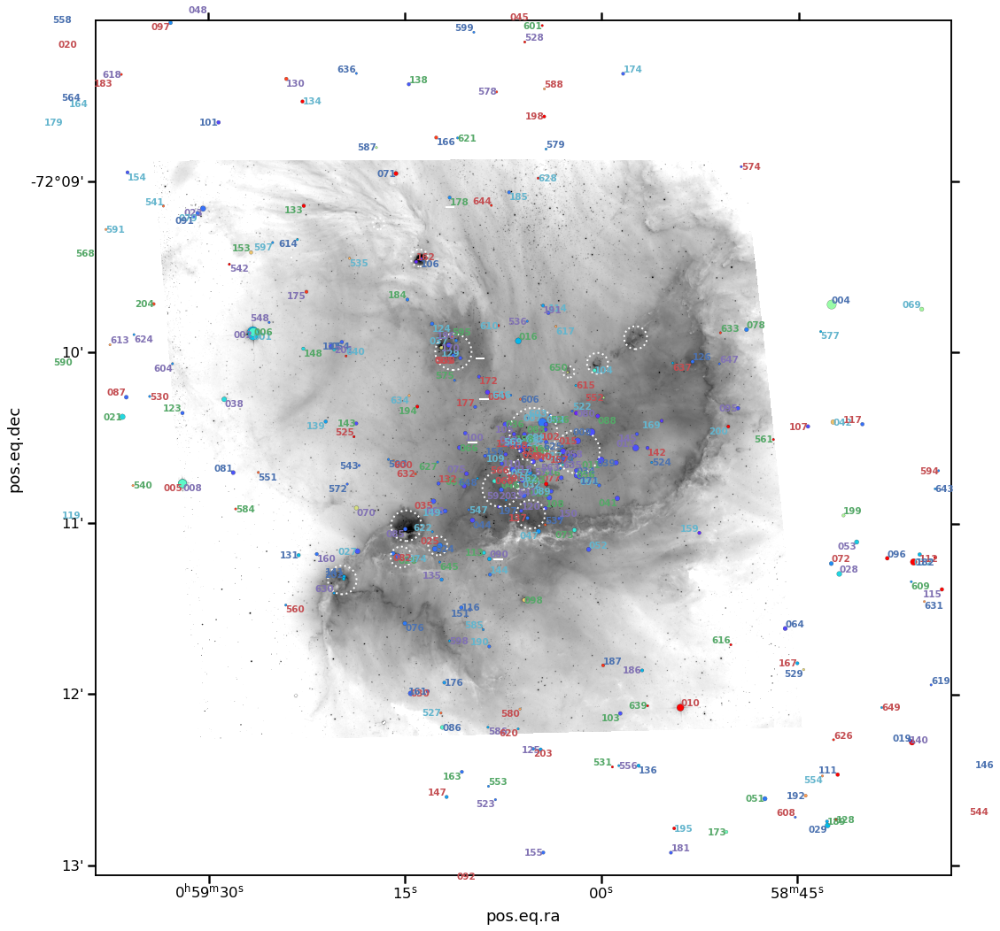

In [449]:
from astropy.table import vstack

dx, dy = 3000, 3000
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-1.0, vmax=0.3, 
    cmap="gray_r",
)
bbstars = vstack([stars[:200], stars[500:600]])
points = ax.scatter(
    bbstars['ra'].data, 
    bbstars['dec'].data, 
    c=bbstars["V-I"].data,
    s=10**(4.5-0.2*bbstars["F555W"]),
    edgecolors="k",
    lw=0.2,
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)

for i, star in enumerate(bbstars):
    xpos = ["left", "right"][i % 2]
    ypos = ["top", "center", "bottom"][i % 3]
    tcol = "cmbrg"[i % 5]
    ax.text(
        star["ra"], star["dec"],
        f"{star['ID']:03d}", 
        fontsize="xx-small",
        ha=xpos,
        va=ypos,
        color=tcol,
        fontweight="black",
        clip_on=False,
        transform=ax.get_transform('world'),   
    )

for data in subclusters:
    circ = SphericalCircle(
        (data["ra"]*u.deg, data["dec"]*u.deg), 
        data["R"]*u.arcsec,
        edgecolor='w', facecolor='none', 
        linestyle="dotted",
        linewidth=2,
        transform=ax.get_transform("world"),
    )
    ax.add_patch(circ)
#    ax.text(
#        data["ra"], data["dec"], data["__SSN2007_"].split()[-1],
#        ha="center", va="center", color="w",
#        fontweight="black",
#        clip_on=True,
#        transform=ax.get_transform("world"),
#    )



ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
)
fig.tight_layout();
fig.savefig("../figs/ngc-346-star-map-bright-A.pdf");

In [407]:
bbstars

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I,reg,sep,diff SSN14
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag,,arcsec,
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32,int64,float64,float32
1,11.570,0.001,11.557,0.001,00 59 26.581,-72 09 53.00,--,14.860827,-72.164722,0.013,0.001,1,106.09,2.5314982
2,11.916,0.001,11.841,0.001,00 59 26.571,-72 09 53.99,--,14.860785,-72.164997,0.075,0.001,1,105.66,2.1950135
4,12.326,0.001,11.793,0.001,00 58 42.424,-72 09 43.27,185,14.676839,-72.162019,0.533,0.001,1,117.81,1.9211498
5,12.551,0.002,12.397,0.001,00 59 31.975,-72 10 46.11,789,14.883302,-72.179475,0.154,0.002,1,122.39,1.5857005
6,12.580,0.001,12.304,0.001,00 59 26.542,-72 09 53.00,--,14.860664,-72.164722,0.276,0.001,1,105.93,1.5918909
7,12.609,0.002,12.742,0.002,00 59 04.479,-72 10 24.77,435,14.768735,-72.173547,-0.133,0.003,1,11.56,1.4840438
8,12.734,0.002,12.398,0.001,00 59 31.975,-72 10 46.13,--,14.883302,-72.179481,0.336,0.002,1,122.39,1.4686158
9,13.454,0.002,13.679,0.003,00 59 00.743,-72 10 28.16,355,14.753168,-72.174489,-0.225,0.004,1,22.68,0.6360068


<ipython-input-435-822f004f3cee>:5: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-435-822f004f3cee>:5: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),
<ipython-input-435-822f004f3cee>:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout();


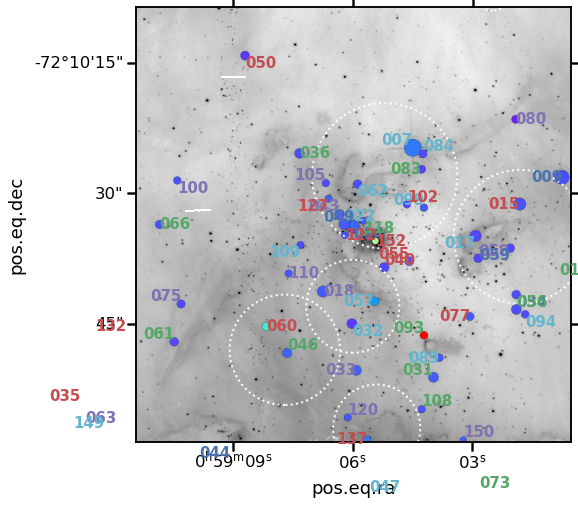

In [435]:
dx, dy = 500, 500
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-0.7, vmax=0.6, 
    cmap="gray_r",
)
bbstars = stars[:150]
points = ax.scatter(
    bbstars['ra'].data, 
    bbstars['dec'].data, 
    c=bbstars["V-I"].data,
    s=10**(5.0-0.2*bbstars["F555W"]),
    edgecolors="k",
    lw=0.2,
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)

for i, star in enumerate(bbstars):
    xpos = ["left", "right"][i % 2]
    ypos = ["top", "center", "bottom"][i % 3]
    tcol = "cmbrg"[i % 5]
    ax.text(
        star["ra"], star["dec"],
        f"{star['ID']:03d}", 
        fontsize="small",
        ha=xpos,
        va=ypos,
        color=tcol,
        fontweight="black",
        clip_on=True,
        transform=ax.get_transform('world'),   
    )

for data in subclusters:
    circ = SphericalCircle(
        (data["ra"]*u.deg, data["dec"]*u.deg), 
        data["R"]*u.arcsec,
        edgecolor='w', facecolor='none', 
        linestyle="dotted",
        linewidth=2,
        transform=ax.get_transform("world"),
    )
    ax.add_patch(circ)
#    ax.text(
#        data["ra"], data["dec"], data["__SSN2007_"].split()[-1],
#        ha="center", va="center", color="w",
#        fontweight="black",
#        clip_on=True,
#        transform=ax.get_transform("world"),
#    )



ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
)
fig.tight_layout();
fig.savefig("../figs/ngc-346-star-map-bright-B.pdf");

<ipython-input-428-ba47f9c7ec9d>:5: RuntimeWarning: divide by zero encountered in log10
  np.log10(imha),
<ipython-input-428-ba47f9c7ec9d>:5: RuntimeWarning: invalid value encountered in log10
  np.log10(imha),
<ipython-input-428-ba47f9c7ec9d>:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout();


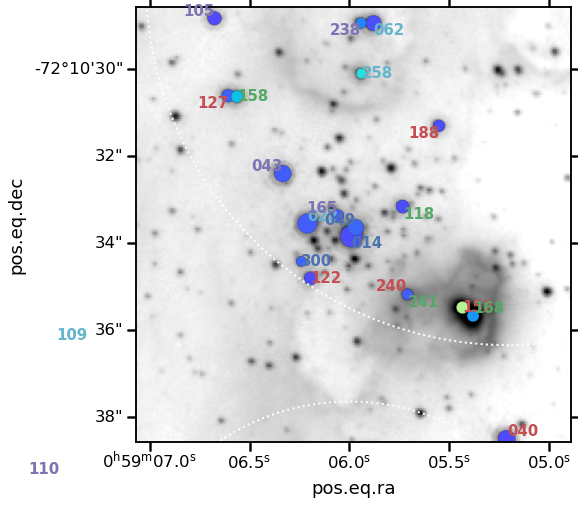

In [428]:
dx, dy = 100, 100
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1, projection=w)
ax.imshow(
    np.log10(imha), 
    vmin=-0.4, vmax=1.0, 
    cmap="gray_r",
)
bbstars = stars[:300]
points = ax.scatter(
    bbstars['ra'].data, 
    bbstars['dec'].data, 
    c=bbstars["V-I"].data,
    s=10**(5.5-0.2*bbstars["F555W"]),
    edgecolors="k",
    lw=0.2,
    vmin=-0.7 + 0.3,
    vmax=1.0 + 0.3,
    cmap="rainbow",
    alpha=1.0,
    transform=ax.get_transform('world'),    
)

for i, star in enumerate(bbstars):
    xpos = ["left", "right"][i % 2]
    ypos = ["top", "center", "bottom"][i % 3]
    tcol = "cmbrg"[i % 5]
    ax.text(
        star["ra"], star["dec"],
        f"{star['ID']:03d}", 
        fontsize="small",
        ha=xpos,
        va=ypos,
        color=tcol,
        fontweight="black",
        clip_on=True,
        transform=ax.get_transform('world'),   
    )

for data in subclusters:
    circ = SphericalCircle(
        (data["ra"]*u.deg, data["dec"]*u.deg), 
        data["R"]*u.arcsec,
        edgecolor='w', facecolor='none', 
        linestyle="dotted",
        linewidth=2,
        transform=ax.get_transform("world"),
    )
    ax.add_patch(circ)
#    ax.text(
#        data["ra"], data["dec"], data["__SSN2007_"].split()[-1],
#        ha="center", va="center", color="w",
#        fontweight="black",
#        clip_on=True,
#        transform=ax.get_transform("world"),
#    )



ax.set(
    xlim=[x0 - dx, x0 + dx],
    ylim=[y0 - dy, y0 + dy],
)
fig.tight_layout();
fig.savefig("../figs/ngc-346-star-map-bright-C.pdf");

The WR binary HD 59080 is not in catalog, so I calaculate its distance by hand:

In [438]:
c0

<SkyCoord (ICRS): (ra, dec) in deg
    (14.77263727, -72.17652881)>

In [439]:
c_hd5980 = SkyCoord("00 59 26.5847969465 -72 09 53.927725716", unit=(u.hourangle, u.deg))
c_hd5980

<SkyCoord (ICRS): (ra, dec) in deg
    (14.86076999, -72.16497992)>

In [441]:
c0.separation(c_hd5980).arcsec

105.66748651745702

In [442]:
stars[stars["ID"] == 46]

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I,reg,sep,diff SSN14
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag,,arcsec,
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32,int64,float64,float32
46,15.267,0.005,15.444,0.006,00 59 07.627,-72 10 48.37,500,14.781852,-72.180103,-0.177,0.008,1,16.39,1.1781044


In [443]:
stars[stars["ID"] == 258]

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I,reg,sep,diff SSN14
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag,,arcsec,
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32,int64,float64,float32
258,17.260,0.013,17.093,0.014,00 59 05.922,-72 10 30.11,--,14.774748,-72.175031,0.167,0.019,1,5.87,3.194515


In [450]:
stars[stars["ID"] == 552]

ID,F555W,e_F555W,F814W,e_F814W,RAJ2000,DEJ2000,MPG,ra,dec,V-I,e_V-I,reg,sep,diff SSN14
,mag,mag,mag,mag,"""h:m:s""","""d:m:s""",,deg,deg,mag,mag,,arcsec,
int32,float32,float32,float32,float32,str12,str12,int16,float64,float64,float32,float32,int64,float64,float32
552,18.217,0.016,17.601,0.018,00 58 59.812,-72 10 16.05,--,14.749289,-72.171125,0.616,0.024,1,32.26,4.2124166
552,26.070,0.084,24.761,0.025,00 59 09.454,-72 12 02.25,--,14.789464,-72.200625,1.309,0.088,3,88.70,12.078194
